## Funciones

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt

# función para obtener analisis de los datos
def analisis_univariable(data, columna):
  count = data[columna].count()
  nans = data[columna].isna().sum()
  q1 = data[columna].quantile(.25)
  median = data[columna].quantile(.5)
  q3 = data[columna].quantile(.75)
  mean = data[columna].mean()
  min = data[columna].min()
  max = data[columna].max()
  std = data[columna].std()
  rango = data[columna].max() - data[columna].min()
  skew = data[columna].skew()

  print(f"ANÁLISIS DE LA COLUMNA {columna}")
  print()
  print("CANTIDAD DE DATOS Y VALORES NANS")
  print(f"- Cantidad de datos     : {count}")
  print(f"- Cantidad de Nans      : {nans}")
  print("---"*30)
  print("CUARTILES")
  print(f"- Primer Cuartil (25%)  : {q1}")
  print(f"- Mediana        (50%)  : {median}")
  print(f"- Tercer Cuartil (75%)  : {q3}")
  print("---"*30)
  print("PROMEDIO Y DESVIACIÓN STANDARD")
  print(f"- Promedio              : {mean}")
  print(f"- Desviación Estándard  : {std}")
  print("---"*30)
  print("VALORES MINIMOS, MAXIMOS Y RANGO")
  print(f"- Valor Mínimo          : {min}")
  print(f"- Valor Máximo          : {max}")
  print(f"- Rango                 : {rango}")
  print("---"*30)
  print("DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT")
  print(f"- Skew                  : {round(skew, 3)}", end="   - ")

  if skew > 0.75:
    print("Distribución está sesgada a la derecha")
  elif skew >= 0 and skew <= 0.75:
    print("Distribución aproximadamente simétrica")
  else:
    print("Distribución está sesgada a la izquierda")

  print("---"*30)
  print("GRÁFICOS")

  # subgráficos para mostrar histograma y boxplot juntos
  fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 fila, 2 columnas

  # Histograma
  sns.histplot(data=data, x=columna, bins=50, ax=axes[0])
  axes[0].set_title(f'Histograma de {columna}')

  # Boxplot
  sns.boxplot(data=data, x=columna, ax=axes[1])
  axes[1].set_title(f'Boxplot de {columna}')

  plt.tight_layout()
  plt.show()

In [3]:
from matplotlib.patches import Patch

def grafico_por_cuartiles(df, columna_agrupacion, columna_promedio, width=12, heigh=6, loc='upper right'):
  agrupacion = df.groupby(columna_agrupacion)[columna_promedio].mean().round(1).sort_values(ascending=False)

  # Definir los cuartiles
  q1 = df[columna_promedio].quantile(0.25)
  q2 = df[columna_promedio].quantile(0.50)
  q3 = df[columna_promedio].quantile(0.75)

  # Asignar colores según el cuartil
  colors = []
  for temp in agrupacion:
      if temp < q1:
          colors.append('slateblue')     # < 25%
      elif q1 <= temp < q2:
          colors.append('seagreen')      # 25% - 50%
      elif q2 <= temp < q3:
          colors.append('sandybrown')    # 50% - 75%
      else:
          colors.append('salmon')        # > 75%

  legend_patches = [
      Patch(color='salmon', label=f'Alta (> {q3})'),
      Patch(color='sandybrown', label=f'Media-alta ({q2} - {q3})'),
      Patch(color='seagreen', label=f'Media-baja ({q1} - {q2})'),
      Patch(color='slateblue', label=f'Baja (< {q1})'),
  ]

  plt.figure(figsize=(width, heigh))
  agrupacion.plot(kind='bar', color=colors)

  for i, v in enumerate(agrupacion):
      plt.text(i, v, str(v), ha='center', va='bottom')

  plt.title(f'Promedio de {columna_promedio} por {columna_agrupacion}')
  plt.xlabel(f'{columna_agrupacion}')
  plt.ylabel(f'Promedio de {columna_promedio}')
  plt.legend(handles=legend_patches, title=f'Rangos de {columna_promedio}', loc=loc)
  plt.tight_layout()
  plt.show()

# Fase 1: Entendiendo el Negocio

---



## Introducción

***CONTEXTO CASO***

Australia, el continente más seco y llano del planeta, presenta una gran diversidad climática, que abarca desde zonas tropicales en el norte hasta regiones desérticas en el centro y áreas templadas en el sureste y suroeste. Su vasta extensión territorial (7.741.220 km²) y características geográficas únicas, como la Gran Cordillera Divisoria y la cuenca del Murray-Darling, influyen significativamente en su clima y distribución poblacional. El país experimenta fenómenos meteorológicos extremos, como sequías, inundaciones y ciclones, lo que lo convierte en un caso de estudio relevante para el análisis de datos climáticos.

En este contexto, se presentan los siguientes datos:



***Descripción del DataSet:***

El dataset contiene registros meteorológicos diarios de múltiples ubicaciones en Australia, con variables que describen condiciones climáticas y mediciones atmosféricas.

**1. Identificadores y Temporales**

- **Fecha:** *Día de la observación.*

- **Ubicación:** *Nombre de la estación meteorológica.*

**2. Variables Climáticas Principales**

- **MinTemp:** *Temperatura mínima del día.*

- **MaxTemp:** *Temperatura máxima del día.*

- **Lluvia:** *Cantidad de precipitación registrada.*

- **Evaporacion:** *Evaporación medida en 24 horas.*

- **Sol:** *Horas de sol brillante en el día.*

**3. Mediciones de Viento**

- **DirRafaga:** *Dirección de la ráfaga de viento más fuerte.*

- **VelRafaga:** *Velocidad máxima del viento.*

- **Dir9am / Dir3pm:** *Dirección del viento a las 9:00 y 15:00 horas.*

- **Vel9am / Vel3pm:** *Velocidad del viento a las 9:00 y 15:00 horas.*

**4. Humedad y Presión Atmosférica**

- **Hum9am / Hum3pm:** *Porcentaje de humedad a las 9:00 y 15:00 horas.*

- **Pres9am / Pres3pm:** *Presión atmosférica a nivel del mar en esos horarios.*

**5. Nubosidad y Temperatura Horaria**

- **Nub9am / Nub3pm:** *Cobertura nubosa.*

- **Temp9am / Temp3pm:** *Temperatura a las 9:00 y 15:00 horas.*

**6. Variables Objetivas**
- **LluviaHoy:** *Binaria (booleana).*

- **RISK_MM:** *Cantidad de lluvia al día siguiente, usada como medida de riesgo.*

- **RainTomorrow:** *Binaria (booleana)*

### **Definición de KPIS**
En este apartado se encuentran definidos los KPIS junto con su objetivo en el mismo.

**1. Precisión de la predicción de lluvia (RainTomorrow)**

- *Exactitud por modelo (Accuracy).*

- **Objetivo:** *Medir qué tan bien el modelo predice si lloverá o no al día siguiente.*


**2. Tasa de verdaderos positivos (Sensitivity / Recall)**

- *Proporción de días lluviosos correctamente identificados.*

- **Objetivo:** *Asegurar que los días con lluvia no pasen desapercibidos.*

**3. Tasa de falsos positivos**

- *Porcentaje de predicciones de lluvia erróneas (cuando en realidad no llovió).*

- **Objetivo:** *Minimizar alarmas innecesarias.*


**4. Importancia de variables predictoras**

- *Relevancia por variable en el modelo.*

- **Objetivo:** *Determinar qué factores meteorológicos influyen más en la predicción.*


**5. Distribución del riesgo (RISK_MM)**

- *Promedio y desviación estándar de RISK_MM en días con y sin lluvia.*

- **Objetivo:** *Validar si RISK_MM es un buen indicador de la intensidad esperada de lluvia.*


**6. Cobertura de datos geográficos**

- Cantidad de ubicaciones meteorológicas cubiertas.
- **Objetivo:** *Evaluar que tan representativo es geograficamente el modelo.*


**7. Calidad y completitud de los datos**

- Porcentaje de valores faltantes o imputados.

- **Objetivo:** *Asegurar la integridad del conjunto de datos para una buena calidad predictiva.*

### Hipótesis

**1. Tipo de Predicción:**

- Dado el contexto climático diverso de Australia se plantea que el problema de análisis debe abordarse mediante un enfoque mixto de predicción.

- El problema de análisis requiere un enfoque mixto: **clasificación** para predecir si lloverá RainTomorrow y **regresión** para estimar la cantidad de lluvia RISK_MM.

- La naturaleza binaria de RainTomorrow y continua de RISK_MM justifican el uso de modelos distintos pero complementarios.

- Dada la **diversidad climática y geográfica de Australia**, se plantea que la precisión del modelo puede variar por región, por lo que se considera útil segmentar el análisis por zonas.


**2. Predicción del Modelo de Regresión:**

- Las variables de humedad, nubosidad y lluvia del día actual son consideradas factores clave para predecir la cantidad de lluvia (RISK_MM).

- La evaporación y las temperaturas extremas también influyen en los niveles de humedad, afectando la precisión del modelo de regresión.

- Se anticipa menor precisión del modelo en regiones áridas, debido a la alta variabilidad y baja frecuencia de precipitaciones.

**3. Predicción del Modelo de Clasificación:**

- El modelo de **clasificación** para predecir RainTomorrow se espera más efectivo en **zonas costeras y tropicales**, donde las lluvias son más frecuentes y predecibles.

- Variables como **humedad (Hum3pm)**, **nubosidad (Nub3pm)** y **lluvia del día actual (LluviaHoy)** son altamente predictivas.

- En **regiones áridas**, se anticipa una **mayor tasa de falsos positivos** debido a la irregularidad de las precipitaciones.

----------------------------------------------------------------------------------------

### Carga de datos
Procedemos a Iniciar el análisis importanda las librerias que usaremos y cargando los datos.

In [5]:
!pip install "numpy<2"

In [7]:
import datetime as dt
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [9]:
data_original = pd.read_csv("../data/weatherAUS.csv", sep=",")
data_original.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


Hacemos una copia de los datos originales para poder trabajar sin alterar los datos originales.

In [11]:
df = data_original.copy()

## Entendiendo el Dataset

Iniciaremos analizando la estructura del dataset.

### Cantidad Registros

In [11]:
print(f'El dataset cuenta con {df.shape[0]} registros')
print(f'El dataset cuenta con {df.shape[1]} columnas')

El dataset cuenta con 142193 registros
El dataset cuenta con 24 columnas


### Tipos de datos

Revisamos las variables categóricas y numéricas del dataset

In [13]:
df.dtypes.value_counts()

float64    17
object      7
Name: count, dtype: int64

In [36]:
categorical = df.select_dtypes(include='object')
categorical

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,month_name,Estacion
0,Albury,W,W,WNW,No,No,December,Verano
1,Albury,WNW,NNW,WSW,No,No,December,Verano
2,Albury,WSW,W,WSW,No,No,December,Verano
3,Albury,NE,SE,E,No,No,December,Verano
4,Albury,W,ENE,NW,No,No,December,Verano
...,...,...,...,...,...,...,...,...
142188,Uluru,E,ESE,E,No,No,June,Invierno
142189,Uluru,E,SE,ENE,No,No,June,Invierno
142190,Uluru,NNW,SE,N,No,No,June,Invierno
142191,Uluru,N,SE,WNW,No,No,June,Invierno


In [38]:
numerical = df.select_dtypes(include='number')
numerical

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM,year,month
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0.0,2008,12
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0.0,2008,12
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0.0,2008,12
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,1.0,2008,12
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.2,2008,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,NaN,NaN,31.0,15.0,13.0,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,0.0,2017,6
142189,2.8,23.4,0.0,NaN,NaN,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,0.0,2017,6
142190,3.6,25.3,0.0,NaN,NaN,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,0.0,2017,6
142191,5.4,26.9,0.0,NaN,NaN,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,0.0,2017,6


Ahora, revisamos la cantidad de dimensiones que posee nuestro dataset, en este caso contamos con 142.193 filas y 17 columnas...

### Datos Nulos

A continuación, se presentan la cantidad de nulos (NANs) por cada variable:

In [19]:
list_nans = [[col, df[col].isna().sum()] for col in df.columns if df[col].isna().sum() > 0]
list_nans_df = pd.DataFrame(list_nans, columns=['Columna', 'Cantidad de nans'])
list_nans_df.sort_values(by='Cantidad de nans', ascending=False)

,Columna,Cantidad de nans
4,Sunshine,67816
3,Evaporation,60843
16,Cloud3pm,57094
15,Cloud9am,53657
13,Pressure9am,14014
14,Pressure3pm,13981
7,WindDir9am,10013
5,WindGustDir,9330
6,WindGustSpeed,9270
8,WindDir3pm,3778


In [21]:
total_nans = list_nans_df['Cantidad de nans'].sum()
print(f"Cantidad total de NaNs: {total_nans}")

Cantidad total de NaNs: 316559


De acuerdo a lo visto anteriormente, tenemos un total de 316.559 de NANs en nuestro dataset.

## Variables categoricas

### Localidades

Hay 49 localidades en el dataset

In [25]:
nro_localidades = df['Location'].nunique()
print(f'Hay {nro_localidades} localidades en el dataset')

Hay 49 localidades en el dataset


Ahora, creamos un grafico de barras con las 10 localidades con mas registro de datos.

En este caso Canberra, Sydney y Perth son las 3 localidades que poseen una mayor cantidad de registros, La primera mencionada, cuenta con un total de 3.418 registros, siendo la mayor, mientras que AliceSprings cuenta con 3.031 registros vigentes, siendo esta ultima, la menor de todas.

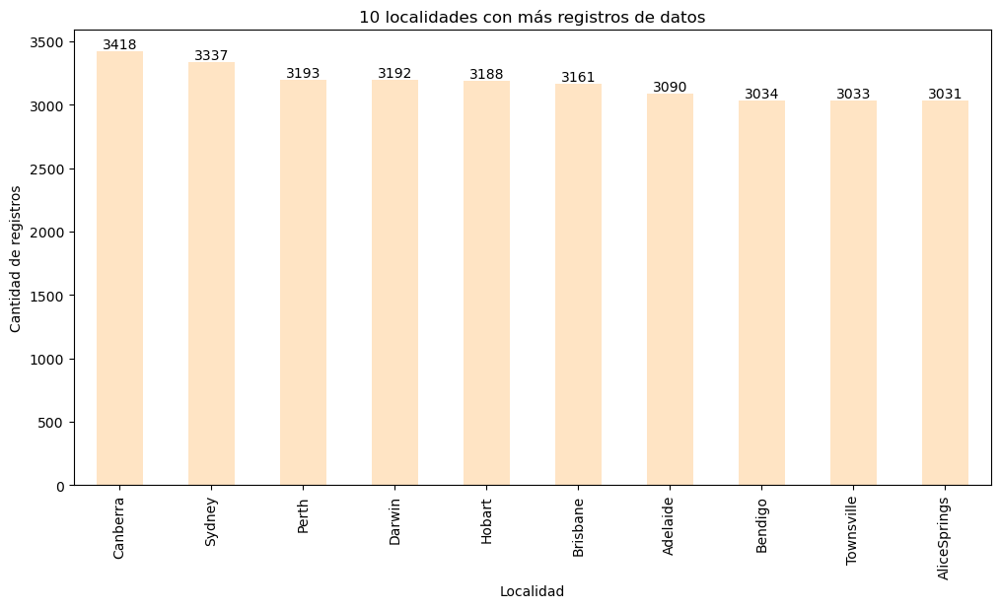

In [27]:
plt.figure(figsize=(12, 6))
ciudades_con_mas_datos = df['Location'].value_counts().head(10)

ciudades_con_mas_datos.plot(kind='bar', color='#FFE4C4')

for i, v in enumerate(ciudades_con_mas_datos):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.title('10 localidades con más registros de datos')
plt.xlabel('Localidad')
plt.ylabel('Cantidad de registros')
plt.show()

### Fechas

Iniciamos el analisis respecto a este grafico referente a la "Cantidad de Registros por año":
- Se observa una clara disminución en la cantidad de registros a medida que avanzan los años, desde más de 17,500 registros en los primeros años hasta solo 61 en el último año mostrado.
- Hay un año (posiblemente el más reciente) con solo 61 registros, lo que representa una anomalía significativa comparado con los demás.
- Los primeros 3 años muestran volúmenes muy similares (entre 17,400-17,508), seguidos por una caída gradual.
- Los años con mayor cantidad de registros (primeros años) proporcionarán resultados más confiables para este análisis. Lo que podría indicar que el año con solo 61 registros probablemente no sea representativo y podría considerarse excluirlo del análisis.



In [16]:
# transformar la columna Date a tipo datetime
df['Date'] = pd.to_datetime(df['Date'])

In [18]:
# agregar una nueva columna que contenga los años
df['year'] = df['Date'].dt.year

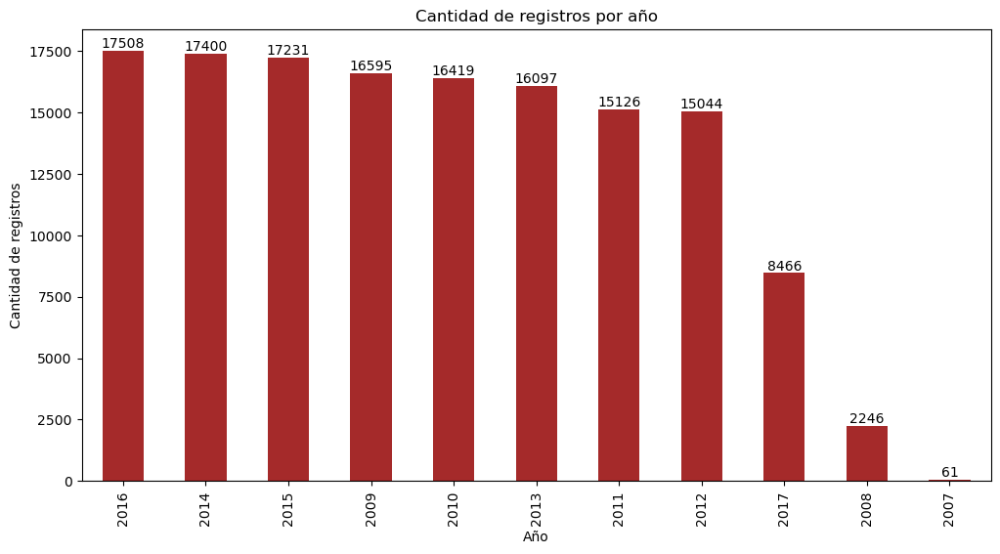

In [20]:
# graficar la cantidad de registros por año
plt.figure(figsize=(12, 6))
register_per_year = df['year'].value_counts()

register_per_year.plot(kind='bar', color='#A52A2A')

for i, v in enumerate(register_per_year):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.title('Cantidad de registros por año')
plt.xlabel('Año')
plt.ylabel('Cantidad de registros')
plt.show()

A continuación, mostramos el análisis de la "Cantidad de registros por meses":

- Mayo (13,055) y marzo (13,036) son los meses con más registros, mientras febrero (10,525) tiene la menor recolección.
- La distribución no sigue una tendencia estacional esperada (verano vs. invierno austral), lo que indica que la recolección de datos podría estar influenciada por factores externos
- La disparidad en los registros exige validar la consistencia de los datos por mes y considerar estrategias de balanceo para evitar sesgos en modelos predictivos, especialmente si se analizan fenómenos estacionales.

In [22]:
# agregar una nueva columna que contenga los meses y el nombre del mes
df['month'] = df['Date'].dt.month
df['month_name'] = df['Date'].dt.month_name()

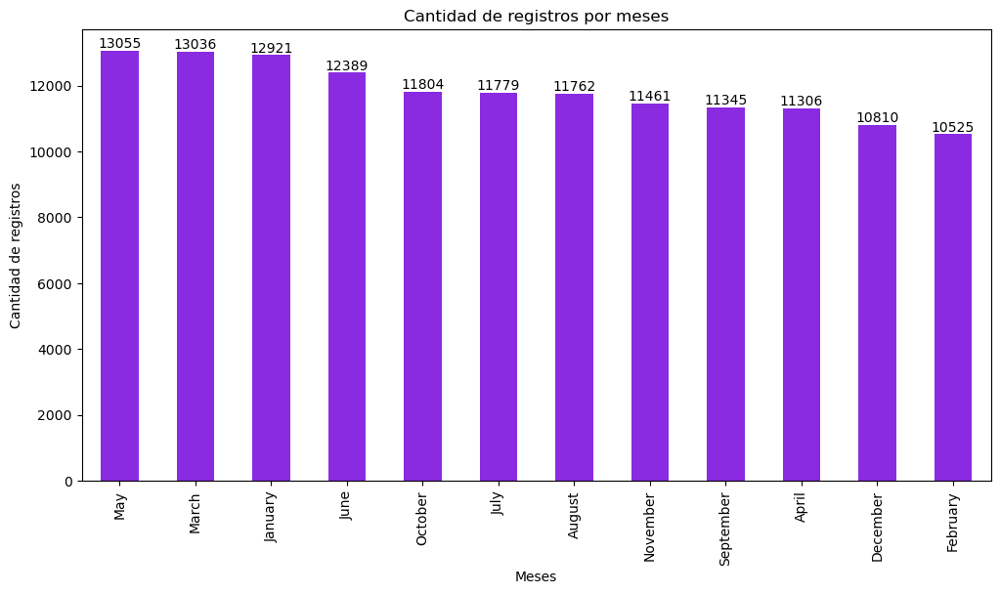

In [24]:
# graficar la cantidad de registros por meses
plt.figure(figsize=(12, 6))
register_per_month = df['month_name'].value_counts()

register_per_month.plot(kind='bar', color='#8A2BE2')

for i, v in enumerate(register_per_month):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.title('Cantidad de registros por meses')
plt.xlabel('Meses')
plt.ylabel('Cantidad de registros')
plt.show()

### Estación del año

En este apartado encontraremos el desglose de gráficos correspondientes a la estacion del año.

In [26]:
def estaciones(mes):
  if mes in [12, 1, 2]:
    return 'Verano'
  elif mes in [3, 4, 5]:
    return 'Otoño'
  elif mes in [6, 7, 8]:
    return 'Invierno'
  else:
    return 'Primavera'

df['Estacion'] = df['month'].apply(estaciones)
df['Estacion'].value_counts()

Estacion
Otoño        37397
Invierno     35930
Primavera    34610
Verano       34256
Name: count, dtype: int64

A continuación, se muestra el análisis del grafico "Promedio de T° maxima por año y estacion":

- Tiene consistentemente el promedio de temperatura máxima más alto entre todas las estaciones, con una tendencia ligeramente creciente con el tiempo.


In [28]:
estacion_year_temp = df.groupby(['Estacion', 'year'])['MaxTemp'].mean().reset_index()

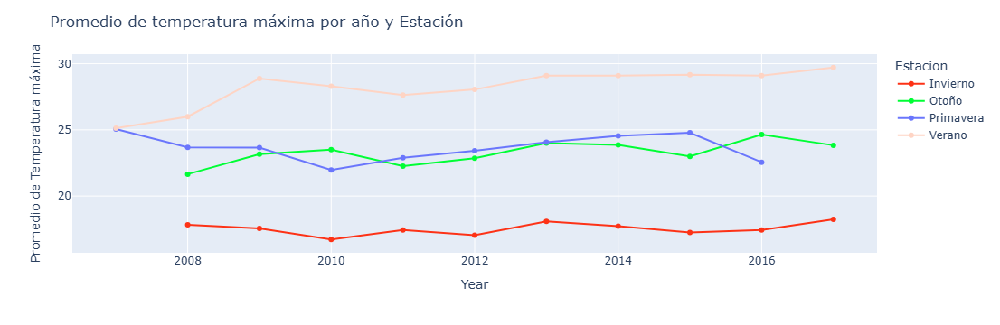

In [30]:
fig = px.line(estacion_year_temp, x='year', y = "MaxTemp", color = "Estacion", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de temperatura máxima por año y Estación",
    xaxis_title="Year",
    yaxis_title="Promedio de Temperatura máxima")
fig.show()

A continuación, mostramos el analisis del grafico "Promedio de lluvia por año y estación":
- Los valores de lluvia presentan rangos entre 0.5 y 2.5, lo que sugiere diferencias significativas entre estaciones o años
- El valor de 2.5 destaca como posible máximo, lo que podría asociarse a eventos de lluvia intensa, monzones o influencias geográficas

In [45]:
estacion_year_rain = df.groupby(['Estacion', 'year'])['Rainfall'].mean().reset_index()

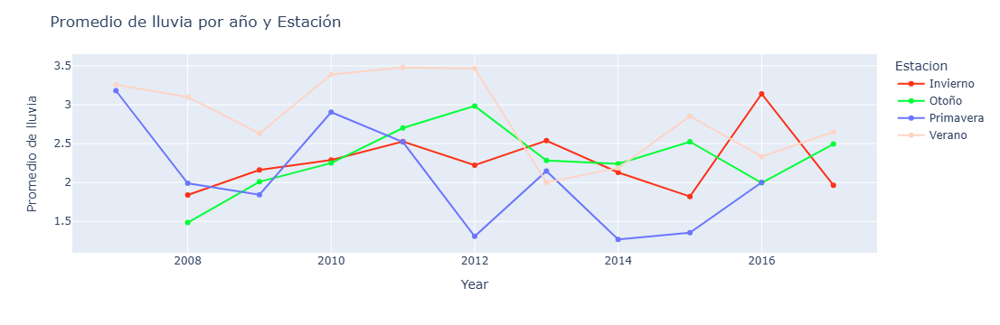

In [47]:
fig = px.line(estacion_year_rain, x='year', y = "Rainfall", color = "Estacion", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de lluvia por año y Estación",
    xaxis_title="Year",
    yaxis_title="Promedio de lluvia")
fig.show()

### Dirección del viento

A continuación, se pressenta el análisis del Gráfico "Dirección del Viento":

- Los vientos más frecuentes provienen del sureste (SE) y este (E), con más de 8,000 registros cada uno.
- Las direcciones menos comunes son noreste (NE) y noroeste (NWV), con menos de 2,000 registros.
- Existe una clara asimetría en la distribución, mostrando preferencia por ciertas orientaciones.
- Podría relacionarse con fenómenos locales como brisas marinas o sistemas de presión recurrentes.



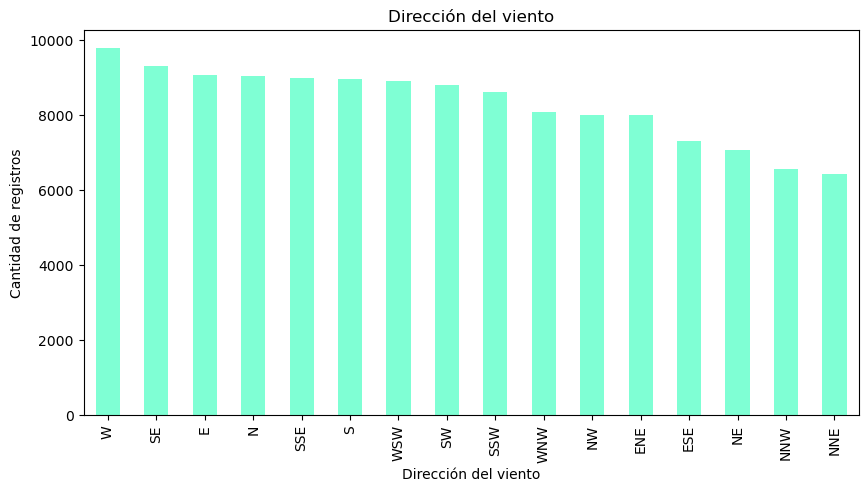

In [49]:
plt.figure(figsize=(10, 5))
df['WindGustDir'].value_counts().plot(kind='bar', color='aquamarine')
plt.title('Dirección del viento')
plt.xlabel('Dirección del viento')
plt.ylabel('Cantidad de registros')
plt.show()

A continuación, exponemos al inferencias del grafico "Dirección del viento 9am" a partir del análisis respectivo:

- Las direcciones SE (Sureste) y E (Este) son las más frecuentes, superando claramente al resto. Esto sugiere un patrón de vientos matutinos recurrentes desde el cuadrante este-sureste.
- Vientos del Noroeste (NWV) y Oeste (W) son los menos registrados, indicando que son direcciones atípicas a esta hora del día.
- La casi ausencia de vientos del oeste (W, SW) sugiere que estos son más frecuentes en otros horarios o bajo condiciones específicas.

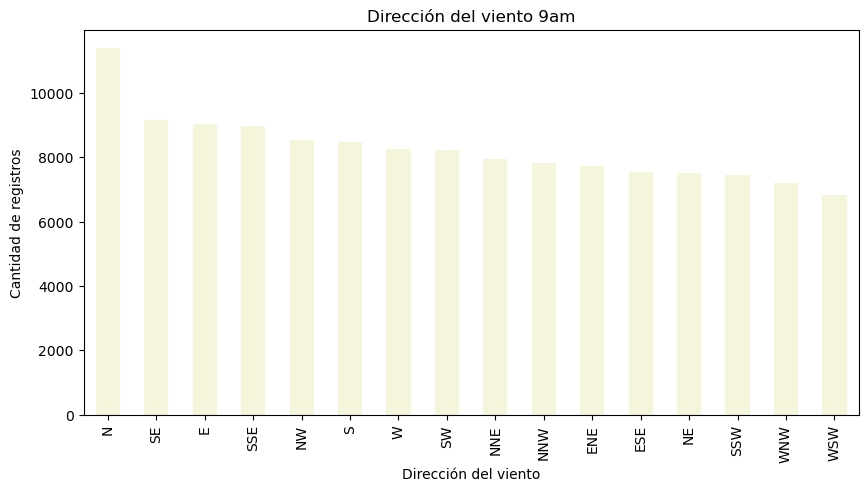

In [51]:
plt.figure(figsize=(10, 5))
df['WindDir9am'].value_counts().plot(kind='bar', color='#F5F5DC')
plt.title('Dirección del viento 9am')
plt.xlabel('Dirección del viento')
plt.ylabel('Cantidad de registros')
plt.show()

A continuación, exponemos al inferencias del grafico "Dirección del viento 3pm" a partir del análisis respectivo:
- Mientras en la mañana dominaban los vientos del SE/E, por la tarde el SE mantiene frecuencia, pero aparece con fuerza el Oeste (W) y Suroeste (SW).
- Las direcciones menos comunes (NWV, NME) son casi inexistentes, similar a lo observado a las 9am.
- La persistencia del SE en ambos horarios indica vientos dominantes de gran escala.

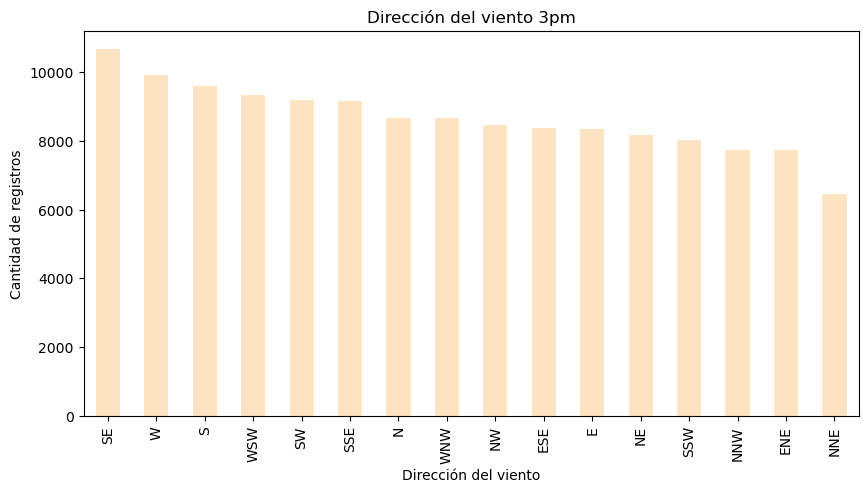

In [53]:
plt.figure(figsize=(10, 5))
df['WindDir3pm'].value_counts().plot(kind='bar', color='#FFE4C4')
plt.title('Dirección del viento 3pm')
plt.xlabel('Dirección del viento')
plt.ylabel('Cantidad de registros')
plt.show()

### Pronostico de lluvia

Ahora, exponemos el analisis del gráfico "Pronóstico de lluvia hoy":
- El gráfico muestra una comparación entre días con lluvia ("Yes") y sin lluvia ("No"), aunque los valores exactos no son visibles.
- Se aprecia una clara diferencia en la altura de las barras, lo que sugiere que los días sin lluvia son mucho más frecuentes que los días con lluvia.
- La gran diferencia entre ambas categorías indica que el conjunto de datos podría estar desbalanceado

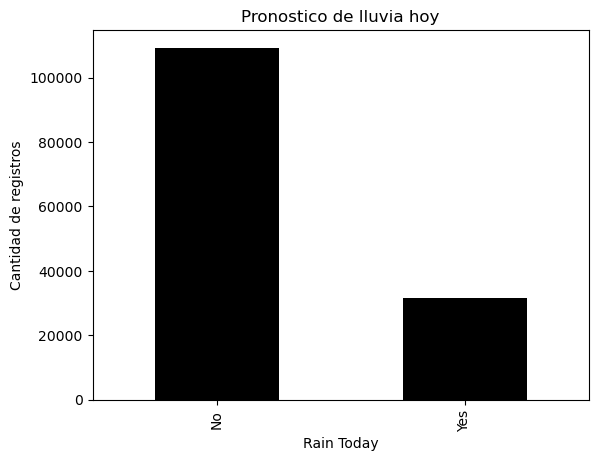

In [55]:
df['RainToday'].value_counts().plot(kind='bar', color='#000000')
plt.title('Pronostico de lluvia hoy')
plt.xlabel('Rain Today')
plt.ylabel('Cantidad de registros')
plt.show()

De acuerdo al Grafico de "Pronóstico de lluvia mañana", se presenta el siguiente análisis:

- Similar al gráfico de "RainToday", se observa una marcada diferencia entre días con lluvia y sin lluvia al día siguiente.
- Los días sin lluvia son significativamente más frecuentes que los días con lluvia.
- Esto refleja el clima predominantemente seco de Australia, donde los días sin precipitaciones son la norma.

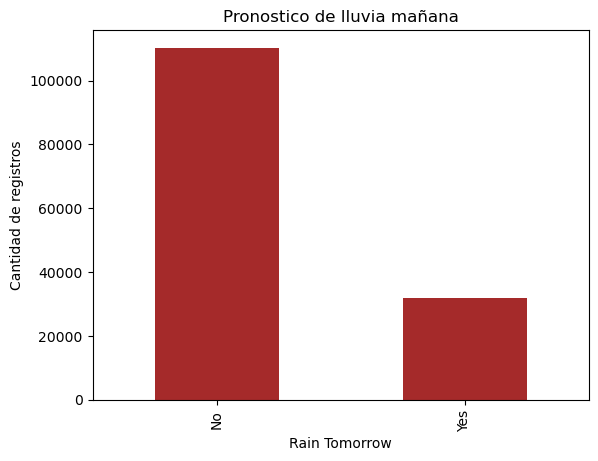

In [57]:
df['RainTomorrow'].value_counts().plot(kind='bar', color='#A52A2A')
plt.title('Pronostico de lluvia mañana')
plt.xlabel('Rain Tomorrow')
plt.ylabel('Cantidad de registros')
plt.show()

### Categoria de nubosidad

Fracción del cielo cubierto por nubes a las 9am. Se mide en "octavos", de
manera que un valor 0 indica cielo totalmente despejado y 8, cielo totalmente
cubierto.

Análisis de "Nubosidad 9am":
- Se observa que los extremos (cielo muy despejado o muy nublado) son menos frecuentes que los valores intermedios.
- Los valores centrales parecen ser los más comunes, lo que sugiere que las mañanas típicas en Australia tienen nubosidad parcial.
- El peak más alto probablemente corresponde a condiciones de "medio nublado"

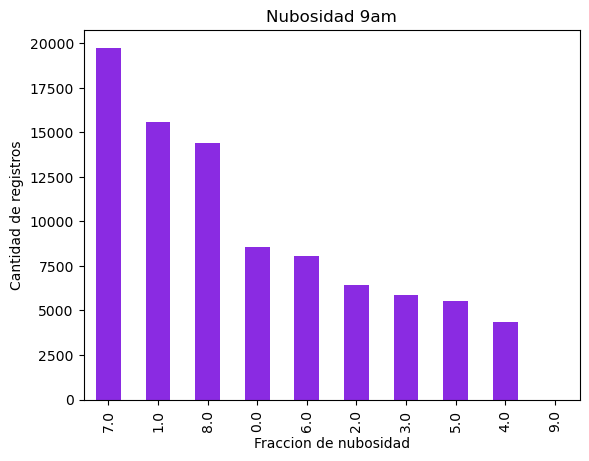

In [59]:
df['Cloud9am'].astype('category').value_counts().plot(kind='bar', color='#8A2BE2')
plt.title('Nubosidad 9am')
plt.xlabel('Fraccion de nubosidad')
plt.ylabel('Cantidad de registros')
plt.show()

Análisis de "Nubosidad 3pm":
- Los valores extremos 7.0 y 1.0 son los más frecuentes, lo que indica que por la tarde predominan condiciones muy nubladas o casi despejadas.
- La presencia de 9.0 sugiere un posible error en los datos.
- Los picos en 7.0 y 8.0 podrían correlacionar con lluvias tardías, alineandose con la variable 'RainTomorrow'.

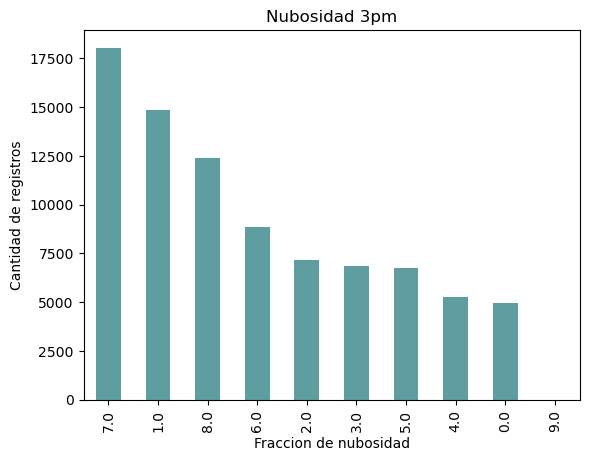

In [61]:
df['Cloud3pm'].astype('object').value_counts().plot(kind='bar', color='#5F9EA0')
plt.title('Nubosidad 3pm')
plt.xlabel('Fraccion de nubosidad')
plt.ylabel('Cantidad de registros')
plt.show()

Analisis del DataFrame que se encuentra a continuación:
- Todos los registros cumplen con que al menos uno de los valores de nubosidad (mañana o tarde) es el máximo (9.0). Esto indica cielos completamente nublados.
- Es interesante: a pesar de la nubosidad máxima, el modelo o la observación no anticipa lluvia al día siguiente.
- No hay relación evidente entre la nubosidad atípica y la lluvia (todos los casos terminaron en RainTomorrow = No).



In [32]:
cloud_9 = df[(df['Cloud3pm'] == 9.0) | (df['Cloud9am'] == 9.0)]
cloud_9

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,year,month,month_name,Estacion
30097,2009-09-23,Sydney,17.0,21.8,4.4,11.2,8.0,NaN,NaN,W,...,3.0,17.3,20.9,Yes,0.0,No,2009,9,September,Primavera
45981,2012-05-27,Canberra,0.6,14.5,0.0,NaN,7.8,SW,30.0,NNW,...,NaN,4.4,14.2,No,0.0,No,2012,5,May,Otoño
104342,2012-11-02,Woomera,10.6,24.6,0.2,11.6,11.4,SSE,39.0,SE,...,9.0,14.8,23.7,No,0.0,No,2012,11,November,Primavera


## Analisis de la temperatura máxima

In [65]:
df['MaxTemp'].describe()

count    141871.000000
mean         23.226784
std           7.117618
min          -4.800000
25%          17.900000
50%          22.600000
75%          28.200000
max          48.100000
Name: MaxTemp, dtype: float64

A continuación, se presenta el análisis del gráfico "Promedio de MaxTemp por Localidad":
- El rango más bajo (17.9) sugiere ubicaciones con climas muy fríos, mientras que el rango medio (12.6 a 28.2) indica climas templados. El rango alto (29.2 a 34.9).
- La locación que lleva la temperatura máximas mas alta es "Katherine", mientras que el mas bajo, se lo lleva la localidad "MountGinini".

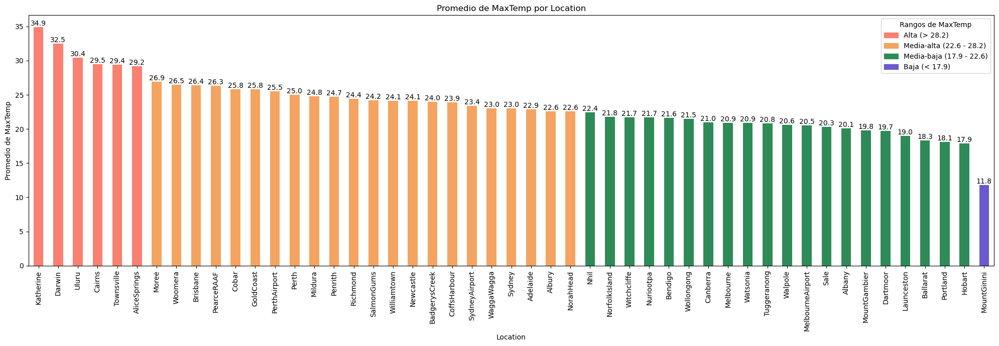

In [73]:
grafico_por_cuartiles(df, 'Location', 'MaxTemp', 20, 7)

Ahora, analizaremos el gráfico correspondiente al "Promedio de MaxTemp por Estacion":
- Tanto en invierno como en verano hay una temperatura diferencial, siendo verano la estacion con mayor tempratura (28.7), mientras que en invierno una temperatura baja (17.4).

- El segundo conjunto sugiere transiciones masa templadas, alcanzando los 23.5 grados tanto en otoño como en primavera.

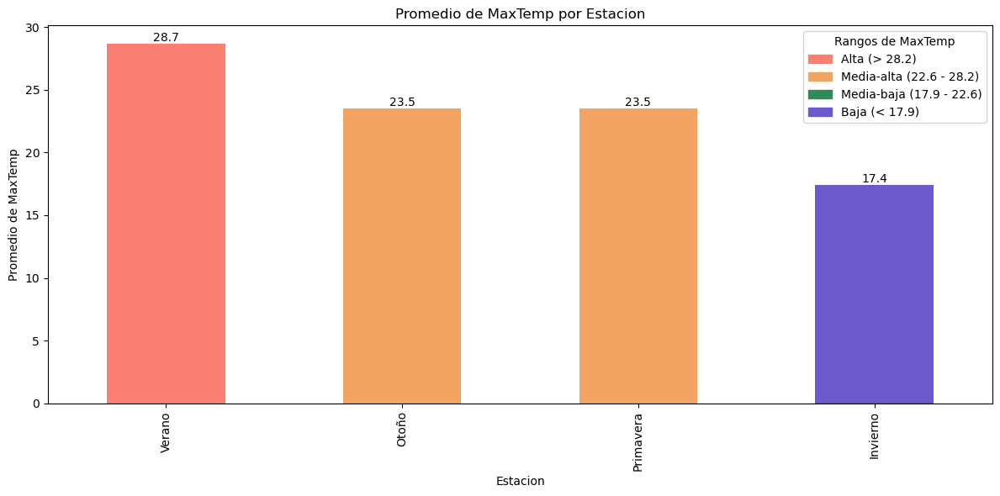

In [75]:
grafico_por_cuartiles(df, 'Estacion', 'MaxTemp')

Análisis del gráfico "Promedio de MaxTemp por mes":
- Enero y febrero registran las temperaturas más altas, cercanas a los 30°C, lo que sugiere que corresponden a la época de verano en esta región.

- Junio y julio presentan las temperaturas más bajas, con promedios alrededor de 18°C, lo que indicaría una temporada invernal moderada
-  Marzo, abril, septiembre, octubre, noviembre y diciembre muestran temperaturas medias-altas (20°C a 26°C), típicas de primavera y otoño.


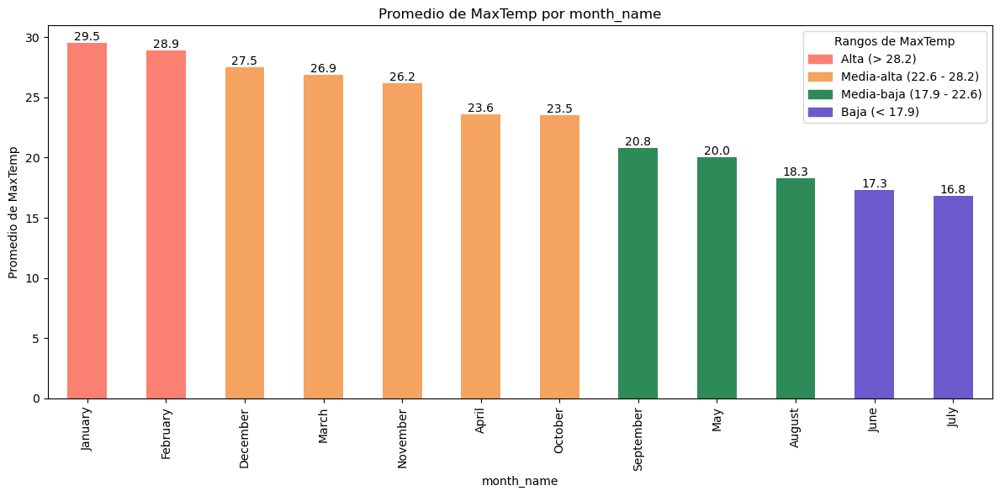

In [77]:
grafico_por_cuartiles(df, 'month_name', 'MaxTemp')

Análisis del gráfico "Promedio de MaxTemp por año":
- Las temperaturas máximas anuales se mantuvieron estables entre 22.4°C y 25.1°C desde 2007 hasta 2017.
- Ningún año superó los 28.2°C, lo que indica que no hubo años extremadamente calurosos.
- Los años más cálidos rondaron 25°C, pero no hay un aumento claro de temperatura con el tiempo.

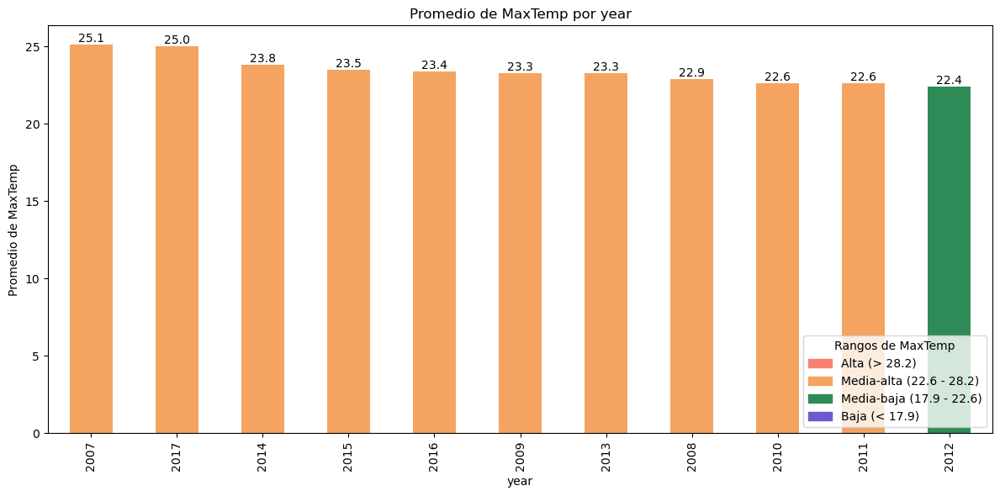

In [79]:
grafico_por_cuartiles(df, 'year', 'MaxTemp', loc='lower right')

El año 2007 es el más caluroso dentro de los promedios dado que este año solo tiene registros de los meses de noviembre y diciembre. Esto puede explicar el porque se muestra como el año mas caluroso en promedio.

In [81]:
df[df['year'] == 2007]['month_name'].value_counts()

month_name
December    31
November    30
Name: count, dtype: int64

El año 2017 tambien posee menos cantidad de meses registrados. Teniendo registros solo desde enero a junio. Lo que puede ser el año mas caluroso a pesar de los meses restantes por registrar

In [83]:
df[df['year'] == 2017]['month_name'].value_counts()

month_name
May         1501
January     1492
March       1480
April       1451
February    1345
June        1197
Name: count, dtype: int64

## Analisis ciudades importantes

Ahora, continuamos con el análisis del siguiete Dataframe, que contiene Patrones Climáticos tanto en las ciudades como la estación del año, en este caso se destaca Syndey y Perth, desatacando lo siguiente:

Sydney (Verano - Febrero 2008):
- **Altas temperaturas:** Máximas entre 22.4°C y 25.7°C, mínimas alrededor de 19.5°C-21.6°C.

- **Lluvias intensas:** Días con 6.0mm a 77.4mm de precipitación (Rainfall), todos marcados como "RainToday=Yes".

Perth (Invierno - Junio 2017):
- **Temperaturas más bajas:** Máximas entre 16.8°C y 19.9°C, mínimas de 6.3°C a 13.3°C.

- **Menos lluvia:** Solo un día con 61.2mm, seguido de días secos "RainToday=No".

In [87]:
important_cities = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane','Perth', 'Adelaide', 'Canberra'])]
important_cities.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,year,month,month_name,Estacion
29497,2008-02-01,Sydney,19.5,22.4,15.6,6.2,0.0,NaN,NaN,S,...,8.0,20.7,20.9,Yes,6.0,Yes,2008,2,February,Verano
29498,2008-02-02,Sydney,19.5,25.6,6.0,3.4,2.7,NaN,NaN,W,...,7.0,22.4,24.8,Yes,6.6,Yes,2008,2,February,Verano
29499,2008-02-03,Sydney,21.6,24.5,6.6,2.4,0.1,NaN,NaN,ESE,...,8.0,23.5,23.0,Yes,18.8,Yes,2008,2,February,Verano
29500,2008-02-04,Sydney,20.2,22.8,18.8,2.2,0.0,NaN,NaN,NNE,...,8.0,21.4,20.9,Yes,77.4,Yes,2008,2,February,Verano
29501,2008-02-05,Sydney,19.7,25.7,77.4,NaN,0.0,NaN,NaN,NNE,...,8.0,22.5,25.5,Yes,1.6,Yes,2008,2,February,Verano


### Temperatura por ciudad y año

Análisis del gráfico "Promedio de MaxTemp por año y ciudad":

- La temperatura más alta registrada fue 32°C (2011 y 2016), y la más baja 24°C (2010).
-  Brisbane es la ciudad con temperaturas máximas promedio más altas en general (26 y 28°C).
- Perth y Brisbane son las ciudades más cálidas y relativamente estables a lo largo de los años.
- Canberra y Melbourne suelen tener las temperaturas máximas más bajas (entre 19 y 24 °C).


In [89]:
temp_by_city = important_cities.groupby(['year', 'Location'])['MaxTemp'].mean().reset_index(name='MaxTemp_mean').round(1)

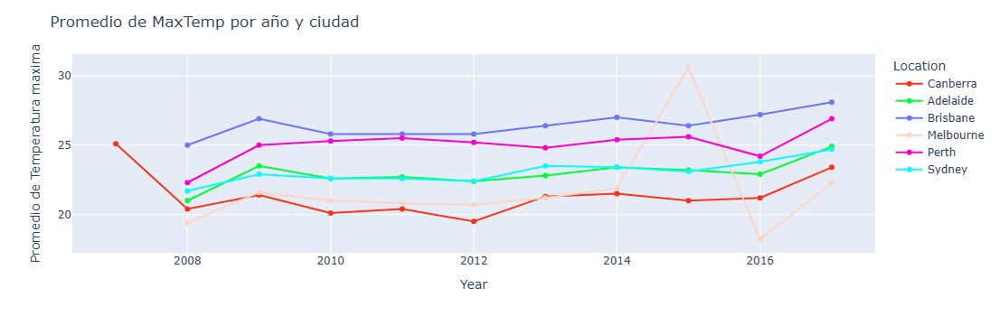

In [91]:
fig = px.line(temp_by_city, x='year', y = "MaxTemp_mean", color = "Location", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de MaxTemp por año y ciudad",
    xaxis_title="Year",
    yaxis_title="Promedio de Temperatura maxima")
fig.show()

En la ciudad de Melbourne en el año 2015 hay pocos registros. Todos ellos son del mes de enero (verano) y se registran temperaturas maximas muy altas, lo que explica el salto tan agresivo del promedio de la temperatura maxima.

In [93]:
important_cities[(important_cities['Location'] == 'Melbourne') & (important_cities['year'] == 2015)]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,year,month,month_name,Estacion
67753,2015-01-01,Melbourne,14.0,27.3,0.0,7.6,10.3,SSE,37.0,SSW,...,NaN,17.6,23.7,No,0.0,No,2015,1,January,Verano
67754,2015-01-02,Melbourne,15.9,39.4,0.0,5.2,10.4,N,54.0,NE,...,5.0,20.8,37.7,No,0.0,No,2015,1,January,Verano
67755,2015-01-03,Melbourne,20.8,38.4,0.0,23.8,8.6,NNE,85.0,N,...,NaN,30.5,37.4,No,5.4,Yes,2015,1,January,Verano
67756,2015-01-04,Melbourne,16.4,23.9,5.4,16.8,7.8,N,70.0,S,...,NaN,16.8,21.8,Yes,0.2,No,2015,1,January,Verano
67757,2015-01-05,Melbourne,15.6,23.9,0.2,6.4,10.3,SSE,35.0,SSE,...,7.0,18.4,22.4,No,0.0,No,2015,1,January,Verano


### Temperaturas mínimas por ciudad y estación del año

El análisis de la temperatura mínima promedio revela una clara variación estacional y geográfica:

- Verano es consistentemente la estación con las temperaturas mínimas más altas en todas las ciudades, siendo Brisbane la ciudad más cálida (21.25 °C), seguida por Sydney (19.73 °C) y Perth (18.03 °C).

- Invierno, como era de esperar, presenta las temperaturas mínimas más bajas, con Canberra destacándose por registrar el valor más bajo del análisis: 0.91 °C, muy por debajo del resto de las ciudades. Las temperaturas mínimas en invierno en las demás ciudades oscilan entre los 7.95 °C y 11.25 °C.

- Otoño y primavera muestran un comportamiento intermedio. En promedio, otoño es ligeramente más frío que primavera en la mayoría de las ciudades, especialmente en Canberra y Melbourne. Esto sugiere una transición más abrupta hacia el invierno que hacia el verano.

- En términos generales, Brisbane y Sydney tienen las temperaturas mínimas más altas a lo largo del año, mientras que Canberra se destaca como la ciudad más fría en todas las estaciones, particularmente en invierno y otoño.

Este análisis refleja tanto la influencia del clima subtropical de ciudades como Brisbane y Sydney, como la exposición continental de Canberra, que experimenta mayores variaciones térmicas.

In [95]:
loc_est_temp = important_cities.groupby(['Location', 'Estacion'])['MinTemp'].mean().round(2)

In [97]:
loc_est_temp = loc_est_temp.unstack()

ordered_seasons = ['Verano', 'Otoño', 'Invierno', 'Primavera']
loc_est_temp = loc_est_temp[ordered_seasons]

In [99]:
loc_est_temp

Estacion,Verano,Otoño,Invierno,Primavera
Location,,,,
Adelaide,17.34,13.26,8.07,12.18
Brisbane,21.25,17.31,11.25,16.35
Canberra,13.27,6.76,0.91,6.44
Melbourne,15.75,12.66,7.95,11.41
Perth,18.03,13.81,8.22,12.09
Sydney,19.73,15.45,9.75,14.90


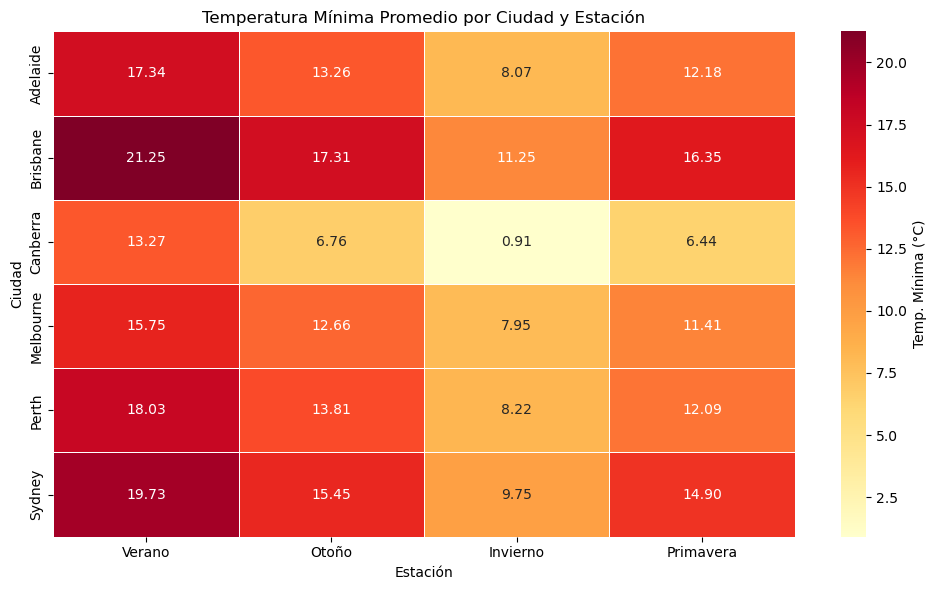

In [101]:
# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(loc_est_temp, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=.5, cbar_kws={'label': 'Temp. Mínima (°C)'})
plt.title("Temperatura Mínima Promedio por Ciudad y Estación")
plt.ylabel("Ciudad")
plt.xlabel("Estación")
plt.tight_layout()
plt.show()

In [103]:
max_temp_city = important_cities.groupby(['Location', 'Estacion'])['MaxTemp'].mean().round(2)

In [105]:
max_temp_city = max_temp_city.unstack()

ordered_seasons = ['Verano', 'Otoño', 'Invierno', 'Primavera']
max_temp_city = max_temp_city[ordered_seasons]

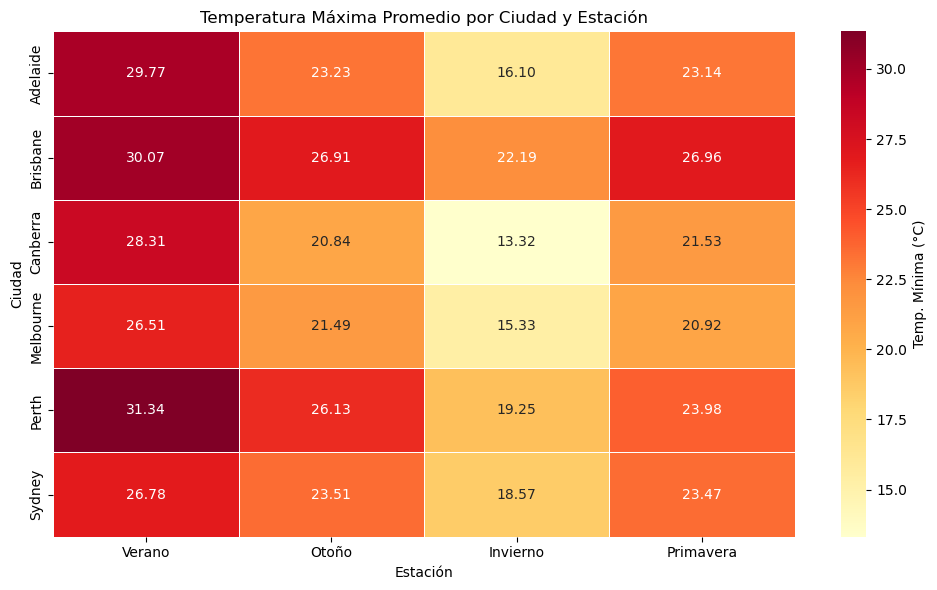

In [107]:
# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(max_temp_city, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=.5, cbar_kws={'label': 'Temp. Mínima (°C)'})
plt.title("Temperatura Máxima Promedio por Ciudad y Estación")
plt.ylabel("Ciudad")
plt.xlabel("Estación")
plt.tight_layout()
plt.show()

### Lluvia por ciudad y año

Por último, analizaremos este gráfico correspondiente al "Promedio de RainFall al año y ciudad":


- Sydney tiene los niveles de precipitación más altos de todas las ciudades.
- Brisbane también posee altos niveles de lluvia, pero alta variabilidad.
- Melbourne, Perth, Adelaide y Canberra Se mantienen relativamente estables con pequeñas fluctuaciones en sus años.


In [109]:
rain_by_city = important_cities.groupby(['year', 'Location'])['Rainfall'].mean().reset_index().round(1)

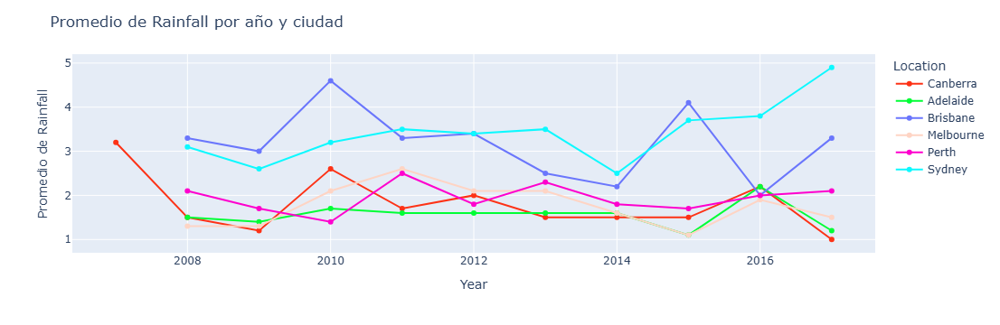

In [111]:
fig = px.line(rain_by_city, x='year', y = "Rainfall", color = "Location", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de Rainfall por año y ciudad",
    xaxis_title="Year",
    yaxis_title="Promedio de Rainfall")
fig.show()

### Lluvia por ciudad y estación del año

El análisis del promedio de precipitaciones por estación en seis ciudades importantes de Australia revela variaciones significativas según la ubicación geográfica y la estación del año.

En general, Brisbane se destaca por presentar el promedio de lluvias más alto en verano (5.39 mm), seguido por Sydney (3.28 mm), lo que indica una mayor concentración de lluvias estivales en la costa este. Por el contrario, ciudades como Adelaide (0.95 mm) y Perth (0.61 mm) tienen veranos considerablemente más secos.

Durante el invierno, Perth y Sydney registran los mayores niveles de precipitación (3.73 mm y 3.66 mm respectivamente), mientras que otras ciudades como Canberra y Melbourne muestran niveles más moderados (alrededor de 1.4 a 1.7 mm).

El otoño presenta altos promedios de lluvia en Sydney (3.99 mm) y Brisbane (3.52 mm), mientras que Canberra es la ciudad con menor lluvia en esa estación (1.35 mm).

En primavera, la distribución es más homogénea, aunque Melbourne y Brisbane tienen valores destacados (2.27 mm y 2.37 mm, respectivamente), en contraste con Adelaide (1.13 mm).

En resumen, se observa que:

- Brisbane y Sydney tienen los promedios más altos de lluvia en general, especialmente en verano y otoño.

- Perth tiene una marcada estacionalidad, con lluvias concentradas en invierno.

- Adelaide y Canberra son las ciudades más secas en la mayoría de las estaciones.

- La primavera tiende a ser una estación de precipitaciones moderadas y más equilibradas entre las ciudades.

Este patrón refleja la influencia del clima subtropical en la costa este y el clima mediterráneo en el suroeste del país.

In [129]:
loc_est_rain = important_cities.groupby(['Location', 'Estacion'])['Rainfall'].mean().round(2)

In [131]:
loc_est_rain = loc_est_rain.unstack()

ordered_seasons = ['Verano', 'Otoño', 'Invierno', 'Primavera']
loc_est_rain = loc_est_rain[ordered_seasons]

In [133]:
loc_est_rain

Estacion,Verano,Otoño,Invierno,Primavera
Location,,,,
Adelaide,0.95,1.63,2.56,1.13
Brisbane,5.39,3.52,1.60,2.37
Canberra,2.22,1.35,1.45,1.94
Melbourne,1.70,1.64,1.70,2.27
Perth,0.61,1.60,3.73,1.57
Sydney,3.28,3.99,3.66,2.31


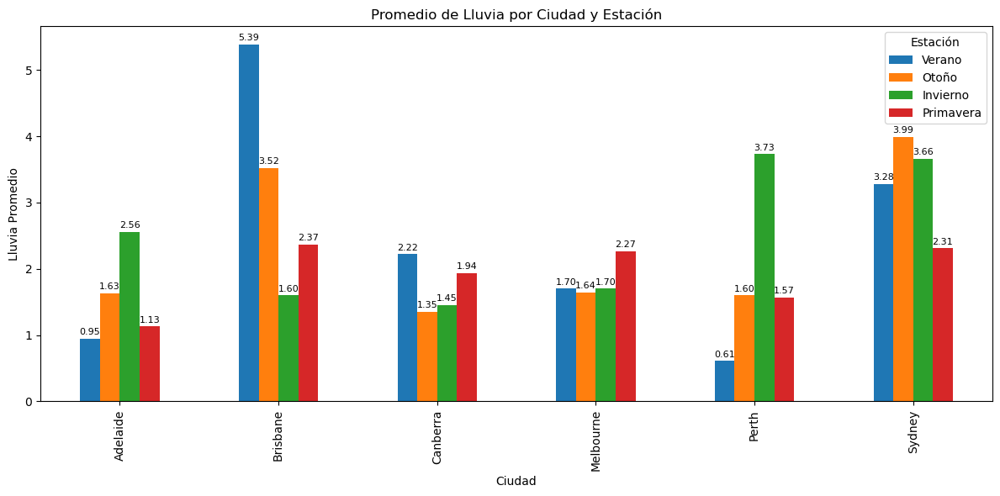

In [135]:
ax = loc_est_rain.plot(kind='bar', figsize=(12, 6))
plt.title('Promedio de Lluvia por Ciudad y Estación')
plt.xlabel('Ciudad')
plt.ylabel('Lluvia Promedio')
plt.legend(title='Estación')
plt.tight_layout()

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=2, fontsize=8)

plt.show()

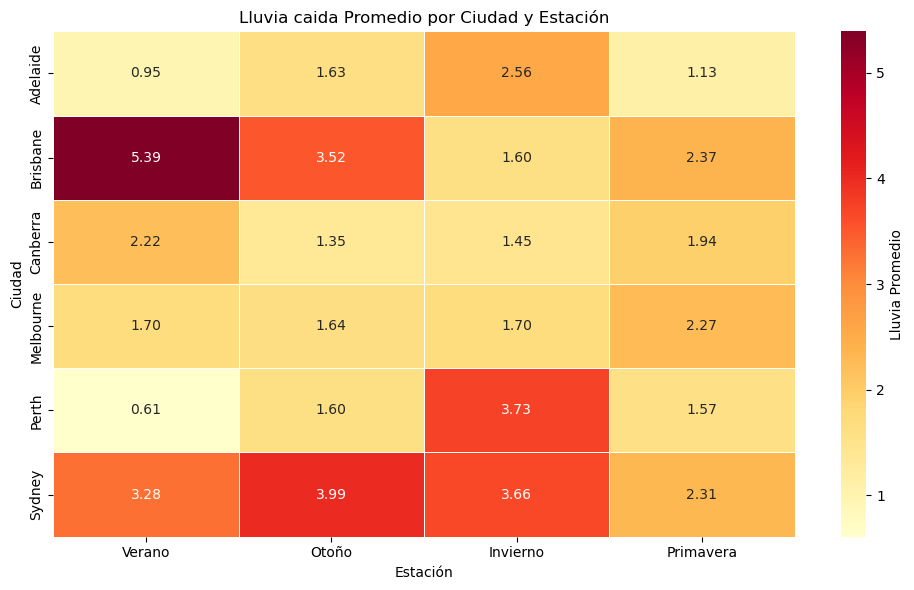

In [137]:
# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(loc_est_rain, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=.5, cbar_kws={'label': 'Lluvia Promedio'})
plt.title("Lluvia caida Promedio por Ciudad y Estación")
plt.ylabel("Ciudad")
plt.xlabel("Estación")
plt.tight_layout()
plt.show()

### Gráfico del mapa de Australia

Para finalizar el análisis de las ciudades importantes, visualizaremos un mapa de Australia mostrando las ciudades importantes, su posición gregráfica y su promedio de lluvia.

In [149]:
mapa = important_cities.groupby('Location')['Rainfall'].mean().round(2).reset_index()

In [151]:
mapa

,Location,Rainfall
0,Adelaide,1.57
1,Brisbane,3.16
2,Canberra,1.74
3,Melbourne,1.84
4,Perth,1.91
5,Sydney,3.33


In [153]:
# Coordenadas aproximadas por ciudad
coords = {
    'Adelaide': (-34.9285, 138.6007),
    'Brisbane': (-27.4698, 153.0251),
    'Canberra': (-35.2809, 149.1300),
    'Melbourne': (-37.8136, 144.9631),
    'Perth': (-31.9505, 115.8605),
    'Sydney': (-33.8688, 151.2093)
}

# Agregar columnas de latitud y longitud
mapa['Latitude'] = mapa['Location'].map(lambda x: coords[x][0])
mapa['Longitude'] = mapa['Location'].map(lambda x: coords[x][1])

In [155]:
mapa

,Location,Rainfall,Latitude,Longitude
0,Adelaide,1.57,-34.9285,138.6007
1,Brisbane,3.16,-27.4698,153.0251
2,Canberra,1.74,-35.2809,149.1300
3,Melbourne,1.84,-37.8136,144.9631
4,Perth,1.91,-31.9505,115.8605
5,Sydney,3.33,-33.8688,151.2093


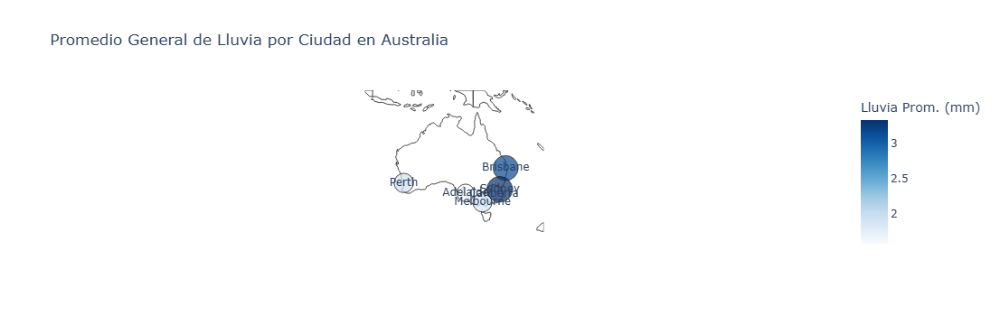

In [157]:
# Crear el mapa
fig = px.scatter_geo(
    mapa,
    lat='Latitude',
    lon='Longitude',
    text='Location',
    color='Rainfall',
    color_continuous_scale='Blues',
    size='Rainfall',
    projection='natural earth',
    title='Promedio General de Lluvia por Ciudad en Australia',
    hover_name='Location',
    hover_data={'Rainfall': ':.2f', 'Latitude': False, 'Longitude': False}
)

# Mejorar estilo del mapa
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_geos(
    lataxis_range=[-45, -10],
    lonaxis_range=[110, 155],
    visible=False,
    showcountries=True,
    showsubunits=True
)
fig.update_layout(coloraxis_colorbar=dict(title='Lluvia Prom. (mm)'))

fig.show()

## Conclusiones Fase 1

Después de haber realizado un análisis exhaustivo del dataset, y considerando tanto los gráficos como el contexto geográfico y climático del país, se pueden sacar las siguientes conclusiones respecto a las hipótesis planteadas:

- El uso de un enfoque mixto (clasificación y regresión) es completamente válido. La variable RainTomorrow es binaria, lo que justifica el uso de modelos de clasificación, mientras que RISK_MM, al ser continua, requiere modelos de regresión. Esta combinación permite abordar el problema de forma más precisa.

- La segmentación por región es acertada. Las diferencias observadas entre ciudades como Sydney (más húmeda) y Perth (más seca) demuestran que los modelos pueden comportarse de forma distinta según la zona.

- Para el modelo de regresión (RISK_MM): Se comprobó que variables como la humedad, la nubosidad y la lluvia actual son altamente influyentes. Además, factores como la evaporación y las temperaturas extremas afectan directamente la precisión, especialmente en climas más secos como el de Alice Springs.

- En cuanto al modelo de clasificación (RainTomorrow): Este resulta más efectivo en regiones costeras y tropicales, donde los patrones de lluvia son más estables. Variables como Hum3pm, Nub3pm y RainToday demostraron ser claves. Sin embargo, en zonas áridas pueden presentarse falsos positivos, ya que la nubosidad no siempre implica lluvia.

# Fase 2: Comprendiendo los Datos

Estos proximos analisis se centran en entender cómo se relacionan entre sí las diferentes variables de nuestro dataset. El objetivo de analizar estas correlaciones es identificar qué variables están más fuertemente ligadas a nuestra variable objetivo (la lluvia del día siguiente) y también entender las relaciones entre las variables predictoras. Esta información es crucial para seleccionar las variables más relevantes para nuestros modelos y para comprender mejor la dinámica del clima en Australia.

Comenzamos esta fase con una matriz de graficos en donde cada gráfico en esta gran cuadrícula nos muestra cómo se relacionan dos variables diferentes de nuestro dataset. en esta encontramos:

* Si miramos los gráficos que comparan "MinTemp" con "MaxTemp", "Temp9am" y "Temp3pm", o "MaxTemp" con las otras temperaturas, probablemente veremos una nube de puntos que se parece bastante a una línea recta que sube. Esto confirma visualmente la fuerte relación positiva que vimos en los números. Cuando una temperatura es alta, la otra también tiende a ser alta.

* Si buscamos la fila o columna de "RainToday", los gráficos de dispersión con otras variables (como la humedad o la nubosidad) nos muestran patrones interesantes.

*  Si miramos el histograma de "Rainfall" o "RISK_MM" en la diagonal, probablemente veremos algo parecido a lo que vimos en nuestros análisis anteriores: muchas barras apiladas cerca del cero (días sin lluvia o con poca lluvia) y una cola larga que se extiende hacia valores más altos (días de mucha lluvia).

## Correlaciones

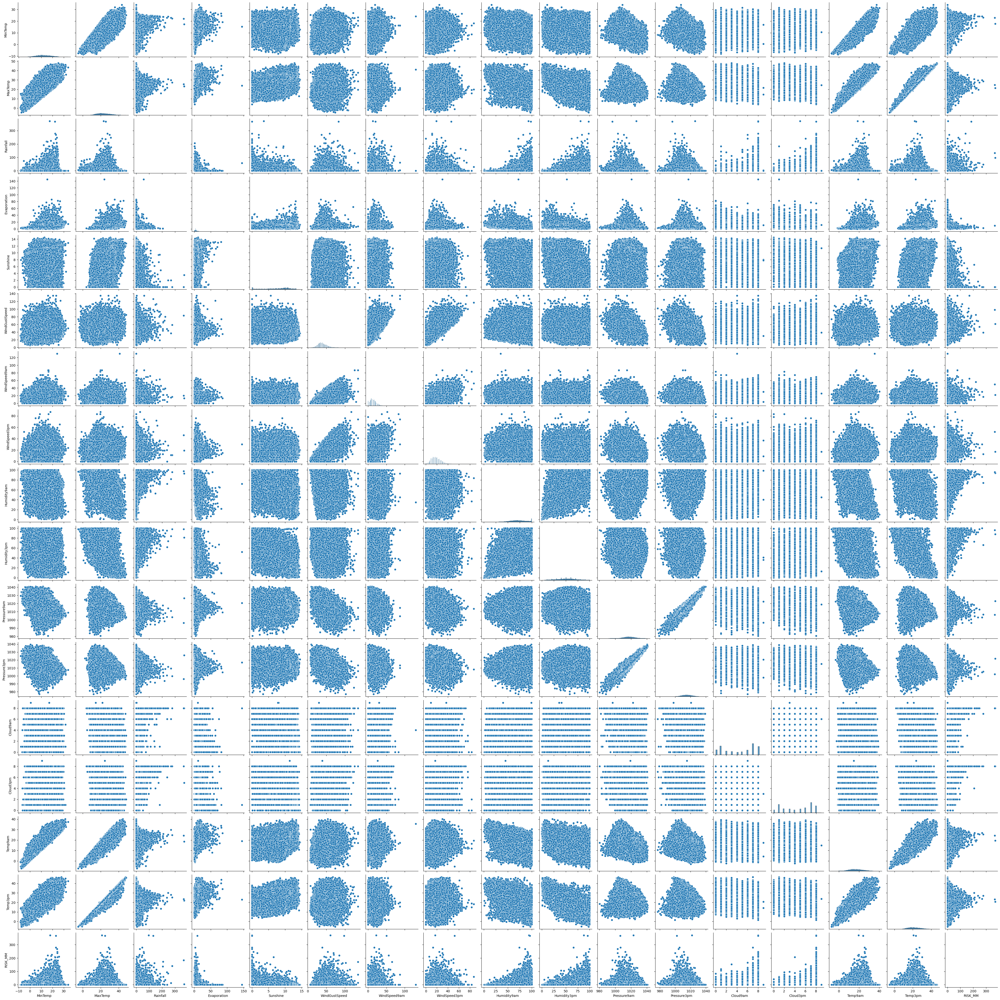

In [14]:
sns.pairplot(df)
plt.show()

Analizamos tambien la matriz de correlaciones detallando las relaciones entre cada par de variables, visualizando la intensidad y dirección de las correlaciones entre las variables de nuestro dataset, permitiendo identificar patrones y relaciones rápidamente.

* Los números entre "MinTemp", "MaxTemp", "Temp9am" y "Temp3pm" son muy cercanos a 1 (0.91 entre "MinTemp" y "Temp9am", y 0.90 entre "MaxTemp" y "Temp3pm"). Esto confirma que las temperaturas en diferentes momentos del día y las temperaturas extremas del día están muy, muy conectadas. Si una sube, las otras casi seguro que también lo hacen.

* El valor (0.31) entre "RainToday" y "RainTomorrow" nos dice que si llovió hoy, hay una tendencia moderada a que también llueva mañana. No es una predicción segura, pero sí una señal a tener en cuenta.

* Las relaciones entre la presión ("Pressure9am" y "Pressure3pm") y la lluvia ("Rainfall" y "RISK_MM") son negativas pero más débiles (alrededor de -0.2). Esto sugiere una ligera tendencia a que cuando la presión es más baja, haya más lluvia, tanto la registrada como la esperada para el día siguiente. Aunque no es una regla de oro, es una pista que los modelos podrían usar.

In [40]:
mat_corr = numerical.corr()

for i in range(mat_corr.shape[0]):
  mat_corr.iloc[i, i] = 0.0

mat_corr

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM,year,month
MinTemp,0.000000,0.736267,0.104255,0.467261,0.072961,0.177285,0.176005,0.175749,-0.234211,0.005999,-0.451260,-0.461623,0.077625,0.020489,0.901813,0.708865,0.124743,0.039245,-0.204279
MaxTemp,0.736267,0.000000,-0.074839,0.588915,0.469967,0.067690,0.014680,0.050800,-0.505432,-0.509270,-0.332293,-0.427279,-0.289865,-0.279053,0.887020,0.984562,-0.044208,0.058388,-0.164622
Rainfall,0.104255,-0.074839,0.000000,-0.064549,-0.227525,0.133497,0.086816,0.057759,0.223725,0.255312,-0.168085,-0.126728,0.198195,0.171993,0.011477,-0.079178,0.308557,-0.009284,-0.030863
Evaporation,0.467261,0.588915,-0.064549,0.000000,0.366607,0.203001,0.193936,0.128895,-0.505890,-0.392785,-0.269907,-0.293160,-0.185032,-0.184287,0.545497,0.574275,-0.043498,0.084141,-0.027912
Sunshine,0.072961,0.469967,-0.227525,0.366607,0.000000,-0.032831,0.008040,0.056012,-0.491603,-0.629122,0.040959,-0.020464,-0.675610,-0.704202,0.291139,0.490180,-0.294973,0.011678,0.023885
WindGustSpeed,0.177285,0.067690,0.133497,0.203001,-0.032831,0.000000,0.604837,0.686419,-0.215461,-0.026663,-0.457891,-0.412922,0.071235,0.109088,0.150258,0.032970,0.162923,-0.032708,0.060918
WindSpeed9am,0.176005,0.014680,0.086816,0.193936,0.008040,0.604837,0.000000,0.519971,-0.270807,-0.031607,-0.227923,-0.174916,0.024280,0.053584,0.129298,0.005108,0.069404,-0.021620,0.051039
WindSpeed3pm,0.175749,0.050800,0.057759,0.128895,0.056012,0.686419,0.519971,0.000000,-0.145942,0.015903,-0.295567,-0.254988,0.052780,0.025269,0.163601,0.028567,0.049240,-0.032806,0.061006
Humidity9am,-0.234211,-0.505432,0.223725,-0.505890,-0.491603,-0.215461,-0.270807,-0.145942,0.000000,0.667388,0.139519,0.186955,0.452182,0.358043,-0.472826,-0.499777,0.172417,0.010708,-0.090564
Humidity3pm,0.005999,-0.509270,0.255312,-0.392785,-0.629122,-0.026663,-0.031607,0.015903,0.667388,0.000000,-0.027449,0.051840,0.517037,0.523270,-0.221467,-0.557989,0.313183,-0.009150,-0.018541


Aquí tenemos un mapa de calor que nos muestra cómo se relacionan entre sí las diferentes variables de nuestro dataset! Cada cuadrito de color nos dice qué tan fuerte es la relación entre dos variables. Los colores más rojizos o anaranjados indican una relación positiva (cuando una variable sube, la otra también tiende a subir), y los colores más oscuros o azulados indican una relación negativa (cuando una variable sube, la otra tiende a bajar). Los números dentro de cada cuadrito nos dan una idea más precisa de qué tan fuerte es esa relación (más cercano a 1 o -1 es una relación más fuerte, cercano a 0 es una relación débil).

* Vemos un color rojo intenso y números cercanos a 1 entre "MinTemp", "MaxTemp", "Temp9am" y "Temp3pm". Esto tiene mucho sentido, ya que las temperaturas mínimas, máximas y las temperaturas en diferentes momentos del día tienden a ir de la mano.

* Vemos un color rojizo y números positivos entre "Cloud9am" y "Cloud3pm" (0.52). Esto indica que si hay muchas nubes por la mañana, es probable que también haya muchas nubes por la tarde.

*Vemos colores más oscuros y números negativos entre "Pressure9am" y "Rainfall" (-0.23), y también entre "Pressure3pm" y "Rainfall" (-0.17). Esto sugiere que cuando la presión atmosférica es más baja, tiende a haber más lluvia.

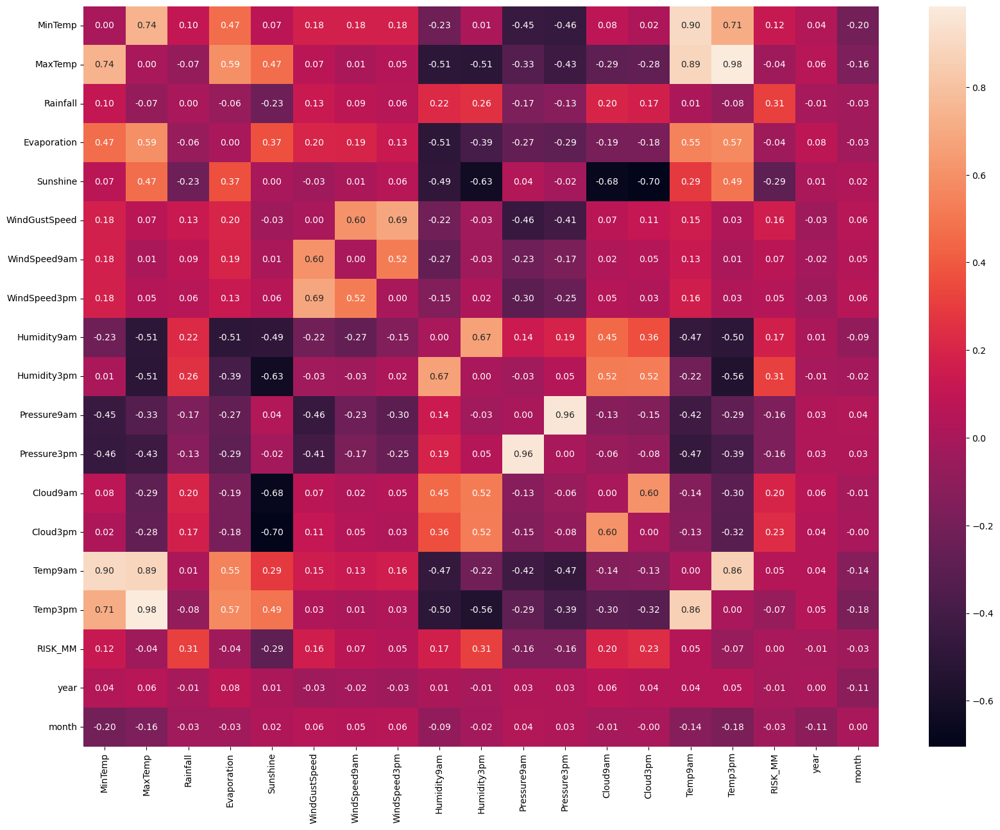

In [42]:
plt.figure(figsize=(20, 15))
sns.heatmap(mat_corr, annot=True, fmt=".2f")
plt.show()

## Analisis univariable

En este apartado analizaremos 12 variables de nuestro interes, describiendo y resumiendo las caracteristicas de cada una por separado, proporcionandonos una comprension mejor de cada una y mencionando los datos mas interesantes según nuestro criterio.

Este análisis nos da un resumen de los valores que encontramos en la columna "MinTemp". Nos dice cuántos datos tenemos en total, cuántos de esos datos faltan (Nans), y luego nos muestra algunas medidas importantes para entender cómo se distribuyen esas temperaturas mínimas.

- Se registraron temperaturas mínimas por debajo de cero (-8.5 grados), lo que nos indica que en algunas zonas de Australia hace bastante frío en ciertos momentos.
- La diferencia entre la temperatura mínima más baja y la más alta es bastante grande (42.4 grados), lo que subraya la diversidad climática del país.
- La temperatura mínima promedio (12.19 grados) está bastante cerca de la mediana (12.0 grados) y el skew es bajo, lo que sugiere que la mayoría de las temperaturas mínimas se agrupan alrededor de este valor central.

ANÁLISIS DE LA COLUMNA MinTemp

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 141556
- Cantidad de Nans      : 637
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 7.6
- Mediana        (50%)  : 12.0
- Tercer Cuartil (75%)  : 16.8
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 12.186399728729265
- Desviación Estándard  : 6.403282674671229
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : -8.5
- Valor Máximo          : 33.9
- Rango                 : 42.4
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 0.024   - Distribución aproximadamente simétrica
-------------------------------------------------

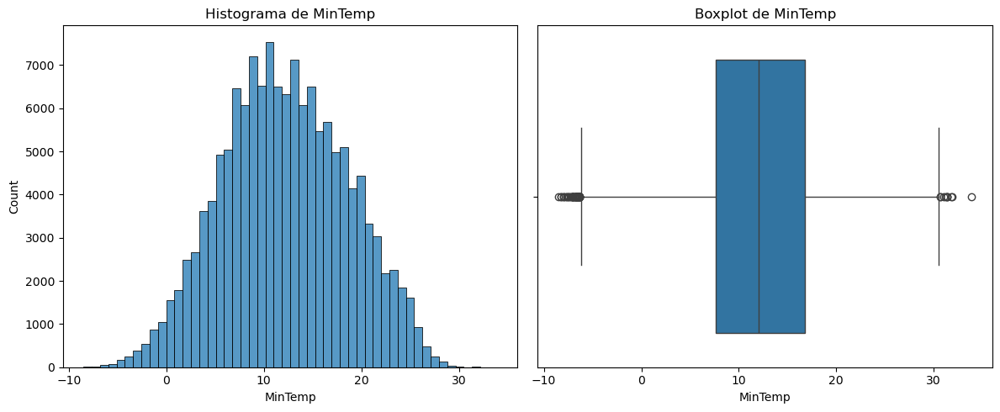

In [44]:
analisis_univariable(df, 'MinTemp')

Similar al análisis de "MinTemp", este nos da un resumen de los valores de la temperatura máxima diaria. Nos indica la cantidad total de datos, cuántos valores faltan (Nans), y luego nos presenta medidas estadísticas clave sobre cómo se distribuyen estas temperaturas máximas.

* Se registraron temperaturas máximas por debajo de cero (-4.8 grados), lo cual es sorprendente y podría indicar eventos climáticos extremos o quizás errores en los datos que habría que investigar.

* Se alcanzaron temperaturas máximas muy altas (48.1 grados), lo que refleja el calor extremo que se puede experimentar en algunas regiones de Australia.

* Aunque la distribución es aproximadamente simétrica, el ligero sesgo positivo indica que hay más días con temperaturas máximas ligeramente por encima del promedio que significativamente por debajo.

ANÁLISIS DE LA COLUMNA MaxTemp

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 141871
- Cantidad de Nans      : 322
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 17.9
- Mediana        (50%)  : 22.6
- Tercer Cuartil (75%)  : 28.2
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 23.226784191272355
- Desviación Estándard  : 7.117618141019296
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : -4.8
- Valor Máximo          : 48.1
- Rango                 : 52.9
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 0.225   - Distribución aproximadamente simétrica
------------------------------------------------

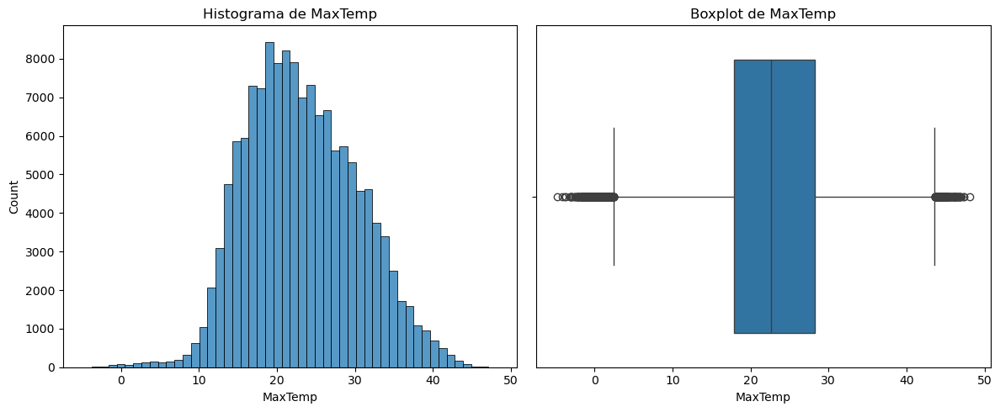

In [46]:
analisis_univariable(df, 'MaxTemp')

Este resumen nos muestra cómo se distribuyen las cantidades de lluvia en nuestro dataset. Nos dice cuántos registros tenemos, cuántos valores faltan (Nans) y nos da algunas medidas estadísticas importantes.

* La mediana y los cuartiles bajos en (0.0) y (0.8) nos dicen que la mayoría de los días tuvieron muy poca o ninguna lluvia.

* El valor máximo (371.0) revela que ocurrieron eventos de lluvia muy intensa en algunos días, lo cual es importante para entender los riesgos de inundación.

* El fuerte sesgo a la derecha nos confirma que los días de lluvia significativa son relativamente raros en comparación con los días secos o con poca lluvia.

ANÁLISIS DE LA COLUMNA Rainfall

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 140787
- Cantidad de Nans      : 1406
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 0.0
- Mediana        (50%)  : 0.0
- Tercer Cuartil (75%)  : 0.8
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 2.349974074310838
- Desviación Estándard  : 8.465172917626072
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 0.0
- Valor Máximo          : 371.0
- Rango                 : 371.0
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 9.888   - Distribución está sesgada a la derecha
-------------------------------------------------

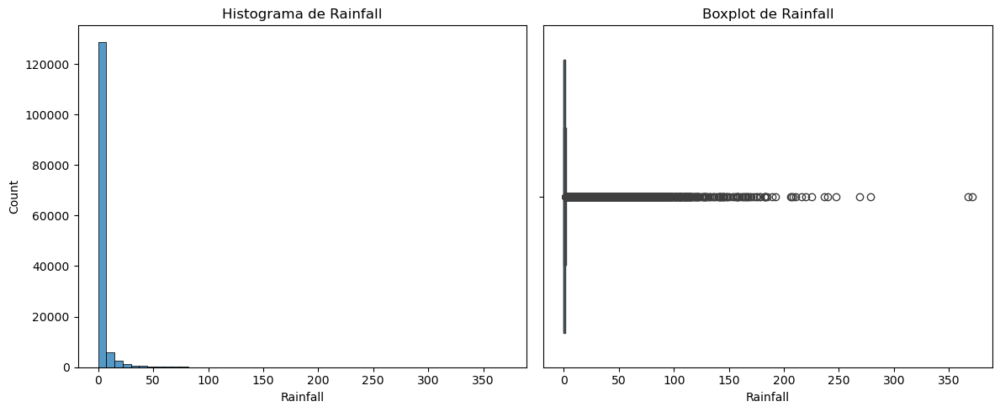

In [48]:
analisis_univariable(df, 'Rainfall')

Este resumen nos muestra cómo se distribuyen las velocidades del viento a las 9 de la mañana en nuestros registros. Nos dice cuántas mediciones tenemos, cuántas nos faltan (Nans), y nos da algunos números importantes para entender la fuerza del viento a esa hora.

* La mediana (13) y el tercer cuartil (19) sugieren que en la mayoría de los días el viento a las 9 am no es demasiado fuerte.

* La velocidad máxima (130) revela la ocurrencia de vientos muy intensos en algunos momentos, lo que podría estar asociado a tormentas o condiciones climáticas particulares.

* El sesgo a la derecha nos dice que son más comunes los días con velocidades de viento bajas o medias a las 9 am, y menos frecuentes los días con vientos muy fuertes.

ANÁLISIS DE LA COLUMNA WindSpeed9am

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 140845
- Cantidad de Nans      : 1348
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 7.0
- Mediana        (50%)  : 13.0
- Tercer Cuartil (75%)  : 19.0
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 14.001988000994
- Desviación Estándard  : 8.893337098233689
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 0.0
- Valor Máximo          : 130.0
- Rango                 : 130.0
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 0.775   - Distribución está sesgada a la derecha
---------------------------------------------

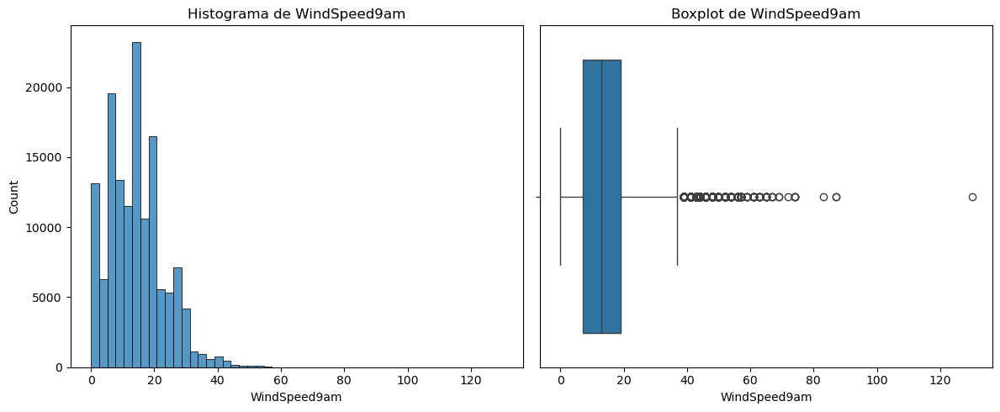

In [50]:
analisis_univariable(df, 'WindSpeed9am')

Este resumen nos muestra cómo se distribuyen las velocidades del viento durante la tarde en nuestros datos. Nos dice cuántas veces se midió, cuántas mediciones nos faltan (Nans), y nos da algunos números importantes para entender la fuerza del viento a esa hora.

* La mediana (19) a las 3 pm es más alta que la mediana (13) a las 9 am, lo que sugiere que el viento tiende a ser más fuerte durante la tarde.

* La velocidad máxima (87.0) es alta, pero no tan extrema como la máxima (130) registrada a las 9 am.

* Al igual que con la velocidad del viento matutina, hay más días con velocidades de viento bajas o medias por la tarde, y menos días con vientos muy fuertes.

ANÁLISIS DE LA COLUMNA WindSpeed3pm

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 139563
- Cantidad de Nans      : 2630
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 13.0
- Mediana        (50%)  : 19.0
- Tercer Cuartil (75%)  : 24.0
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 18.63757586179718
- Desviación Estándard  : 8.803345036237
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 0.0
- Valor Máximo          : 87.0
- Rango                 : 87.0
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 0.631   - Distribución aproximadamente simétrica
-----------------------------------------------

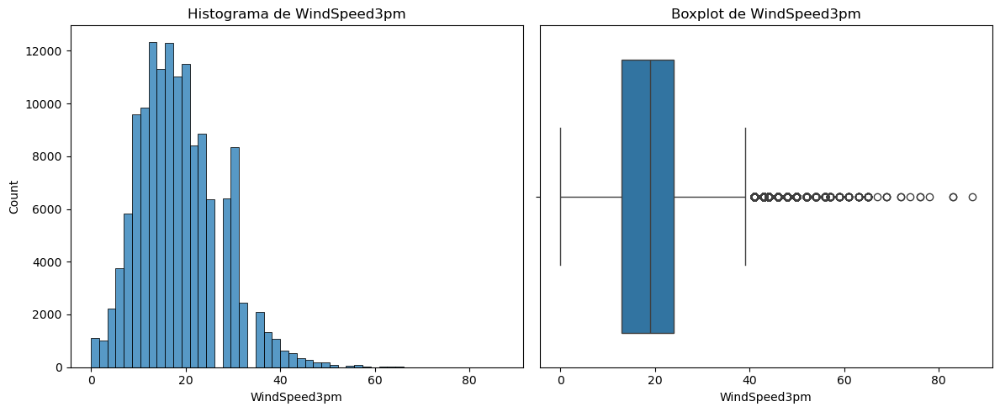

In [52]:
analisis_univariable(df, 'WindSpeed3pm')

Este resumen nos muestra cómo se distribuyen las mediciones de la presión atmosférica a las 9 de la mañana en nuestros registros. Nos dice cuántas mediciones tenemos, cuántas nos faltan (Nans), y nos da algunos números importantes para entender la presión a esa hora.

* El promedio (1017.65) y la mediana (1017.6)están muy cerca, lo que sugiere que la presión atmosférica a las 9 am tiende a centrarse alrededor de este valor.

* A pesar de la desviación estándar relativamente baja, el rango de presiones (60.5) muestra que ha habido variaciones importantes en la presión atmosférica matutina.

* Los valores mínimo (980.5) y máximo (1041.0) indican la ocurrencia de condiciones atmosféricas extremas, aunque poco frecuentes.

ANÁLISIS DE LA COLUMNA Pressure9am

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 128179
- Cantidad de Nans      : 14014
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 1012.9
- Mediana        (50%)  : 1017.6
- Tercer Cuartil (75%)  : 1022.4
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 1017.6537584159653
- Desviación Estándard  : 7.10547571152079
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 980.5
- Valor Máximo          : 1041.0
- Rango                 : 60.5
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : -0.096   - Distribución está sesgada a la izquierda
-------------------------------

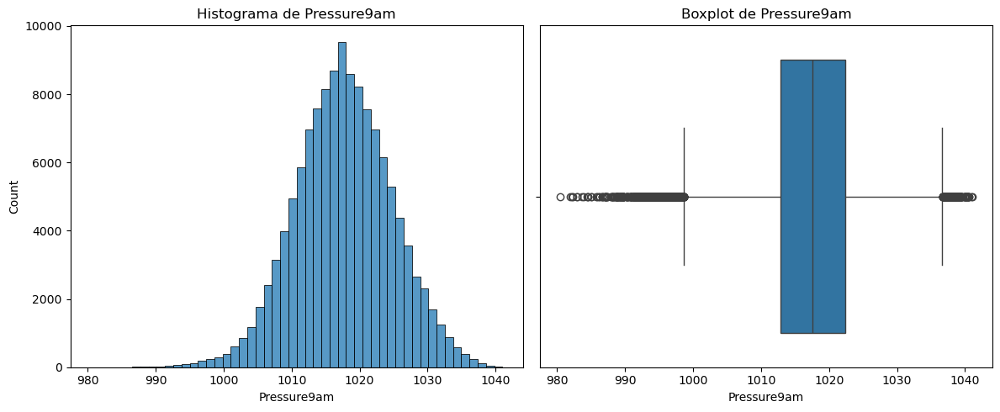

In [54]:
analisis_univariable(df, 'Pressure9am')

Este resumen nos muestra cómo se distribuyen las mediciones de la presión atmosférica a las 3 de la tarde en nuestros registros. Nos dice cuántas mediciones tenemos, cuántas nos faltan (Nans), y nos da algunos números importantes para entender la presión a esa hora.

* El promedio (1015.26) a las 3 pm es un poco más bajo que el promedio (1017.65) a las 9 am, lo que nos dice que hay tendencia a la baja de la presión durante el día.

* Los valores mínimo y máximo de la presión vespertina son cercanos a los de la mañana, sugiriendo que los eventos de presión muy alta o muy baja ocurren en ambos momentos del día.

* Al igual que con la presión matutina, la distribución de la presión vespertina muestra una ligera tendencia hacia valores un poco más bajos que el promedio.

ANÁLISIS DE LA COLUMNA Pressure3pm

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 128212
- Cantidad de Nans      : 13981
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 1010.4
- Mediana        (50%)  : 1015.2
- Tercer Cuartil (75%)  : 1020.0
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 1015.2582035378904
- Desviación Estándard  : 7.036676783493754
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 977.1
- Valor Máximo          : 1039.6
- Rango                 : 62.499999999999886
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : -0.046   - Distribución está sesgada a la izquierda
----------------

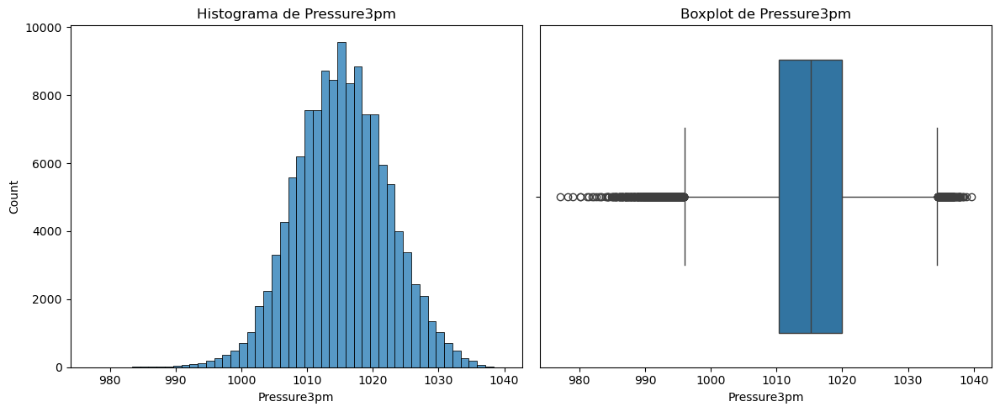

In [56]:
analisis_univariable(df, 'Pressure3pm')

Este resumen nos muestra cómo se distribuyen los niveles de humedad a las 9 de la mañana en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan (Nans), y nos da algunos números importantes para entender qué tan húmedo suele estar el aire a esa hora.

* La mediana (70) y el tercer cuartil (83) sugieren que en la mayoría de los días el aire está bastante húmedo a las 9 de la mañana.

* Los valores extremos (0) (100) muestran que se han dado todas las condiciones posibles de humedad a esa hora.

* La desviación estándar (19.05) nos dice que la humedad matutina puede cambiar bastante de un día para otro.

ANÁLISIS DE LA COLUMNA Humidity9am

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 140419
- Cantidad de Nans      : 1774
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 57.0
- Mediana        (50%)  : 70.0
- Tercer Cuartil (75%)  : 83.0
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 68.8438103105705
- Desviación Estándard  : 19.051292535337954
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 0.0
- Valor Máximo          : 100.0
- Rango                 : 100.0
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : -0.483   - Distribución está sesgada a la izquierda
----------------------------------------

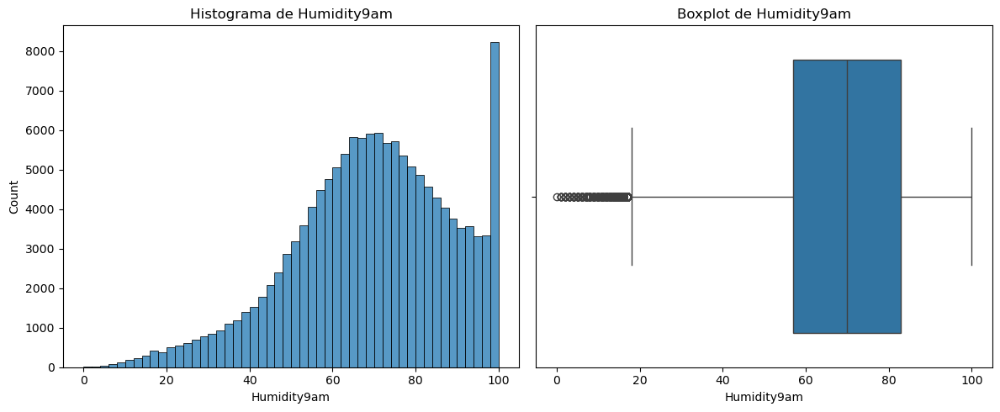

In [58]:
analisis_univariable(df, 'Humidity9am')

Este resumen nos muestra cómo se distribuyen los niveles de humedad durante la tarde en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan (Nans), y nos da algunos números importantes para entender qué tan húmedo suele estar el aire a esa hora.

* La mediana (52) a las 3 pm es más baja que la mediana (70) a las 9 am, lo que sugiere que el aire tiende a ser más seco durante la tarde.

* La desviación estándar (20.79) es parecida a la de la mañana (19.05), indicando que la humedad puede cambiar bastante a lo largo del día.

*  A diferencia de la mañana, la distribución de la humedad por la tarde es más simétrica, con una cantidad similar de días con niveles de humedad altos y bajos.

ANÁLISIS DE LA COLUMNA Humidity3pm

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 138583
- Cantidad de Nans      : 3610
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 37.0
- Mediana        (50%)  : 52.0
- Tercer Cuartil (75%)  : 66.0
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 51.482606091656265
- Desviación Estándard  : 20.79777184369919
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 0.0
- Valor Máximo          : 100.0
- Rango                 : 100.0
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 0.035   - Distribución aproximadamente simétrica
------------------------------------------

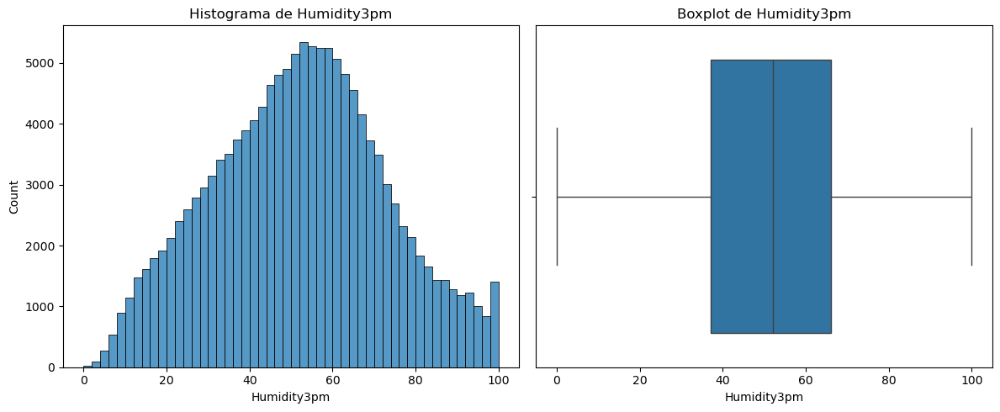

In [60]:
analisis_univariable(df, 'Humidity3pm')

Este resumen nos muestra cómo se distribuyen las temperaturas a las 9 de la mañana en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan, y nos da algunos números importantes para entender qué tan frío o caluroso suele estar a esa hora.

* La mediana (16.7) sugiere que la temperatura a las 9 de la mañana suele ser agradable.

*Los valores extremos (-7.2 y 40.2) muestran que se han dado condiciones de frío intenso y calor significativo a esa hora.

* La desviación estándar (6.49) nos indica que la temperatura matutina no varía drásticamente de un día para otro.

ANÁLISIS DE LA COLUMNA Temp9am

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 141289
- Cantidad de Nans      : 904
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 12.3
- Mediana        (50%)  : 16.7
- Tercer Cuartil (75%)  : 21.6
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 16.987508581701338
- Desviación Estándard  : 6.492838325478664
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : -7.2
- Valor Máximo          : 40.2
- Rango                 : 47.400000000000006
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 0.091   - Distribución aproximadamente simétrica
----------------------------------

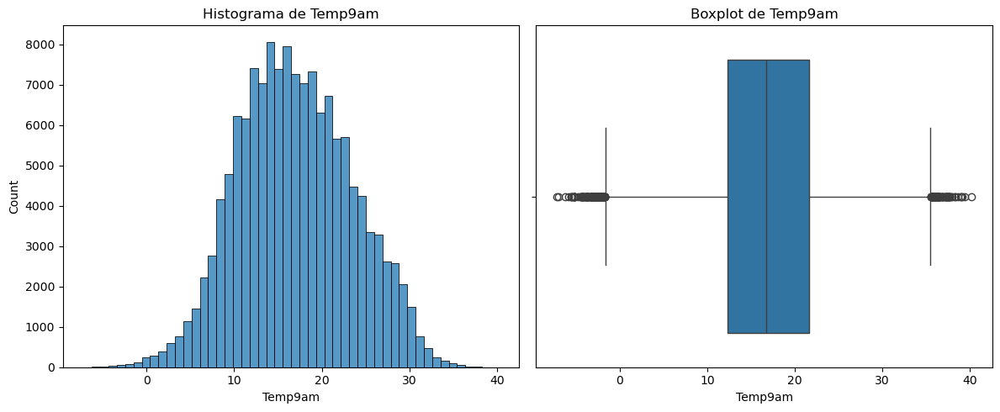

In [62]:
analisis_univariable(df, 'Temp9am')

Este resumen nos muestra cómo se distribuyen las temperaturas durante la tarde en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan, y nos da algunos números importantes para entender qué tan frío o caluroso suele estar a esa hora.

* La mediana (21.1) a las 3 pm es más alta que la mediana (16.7) a las 9 am, lo que sugiere que la tarde suele ser más cálida que la mañana.

* El valor mínimo (-0.4) indica que incluso por la tarde se pueden dar temperaturas bajo cero, aunque seguramente no sean lo más común.

* La diferencia entre la temperatura más baja y la más alta (52.1) muestra que las tardes pueden ser muy frías o muy calurosas.

ANÁLISIS DE LA COLUMNA Temp3pm

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 139467
- Cantidad de Nans      : 2726
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 16.6
- Mediana        (50%)  : 21.1
- Tercer Cuartil (75%)  : 26.4
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 21.687234973147767
- Desviación Estándard  : 6.937593868533564
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : -5.4
- Valor Máximo          : 46.7
- Rango                 : 52.1
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 0.24   - Distribución aproximadamente simétrica
------------------------------------------------

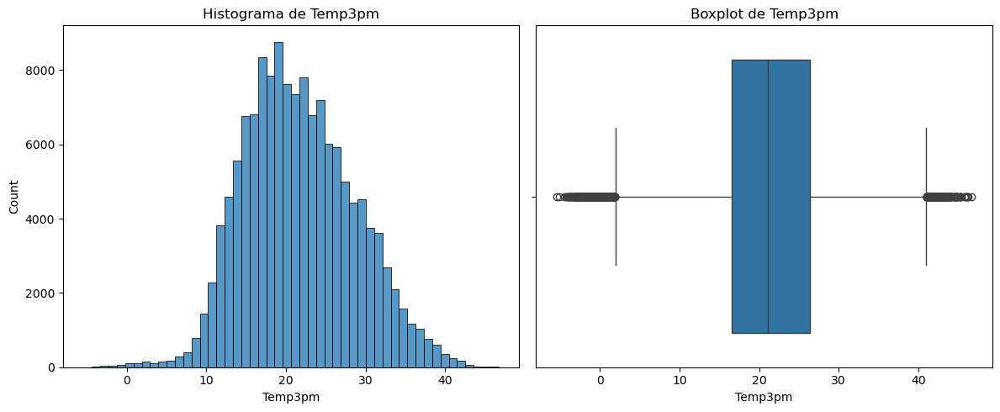

In [64]:
analisis_univariable(df, 'Temp3pm')

Este resumen nos muestra cómo se distribuyen las cantidades de lluvia pronosticadas para el día siguiente en nuestros registros. Nos dice cuántas predicciones tenemos y nos da algunos números importantes para entender qué tanta lluvia se espera normalmente.

*  La mediana y los cuartiles (0.0) nos dicen que en la mayoría de los casos, no se pronostica lluvia para el día siguiente.

* La desviación estándar (8.4779) y el rango (371,0) muestran que la cantidad de lluvia que se espera para el día siguiente varía muchísimo.

* El fuerte sesgo a la derecha nos confirma que las predicciones de lluvia significativa son poco comunes en comparación con las predicciones de días secos o con poca lluvia.

ANÁLISIS DE LA COLUMNA RISK_MM

CANTIDAD DE DATOS Y VALORES NANS
- Cantidad de datos     : 142193
- Cantidad de Nans      : 0
------------------------------------------------------------------------------------------
CUARTILES
- Primer Cuartil (25%)  : 0.0
- Mediana        (50%)  : 0.0
- Tercer Cuartil (75%)  : 0.8
------------------------------------------------------------------------------------------
PROMEDIO Y DESVIACIÓN STANDARD
- Promedio              : 2.3606816087993083
- Desviación Estándard  : 8.477969069234438
------------------------------------------------------------------------------------------
VALORES MINIMOS, MAXIMOS Y RANGO
- Valor Mínimo          : 0.0
- Valor Máximo          : 371.0
- Rango                 : 371.0
------------------------------------------------------------------------------------------
DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT
- Skew                  : 9.837   - Distribución está sesgada a la derecha
----------------------------------------------------

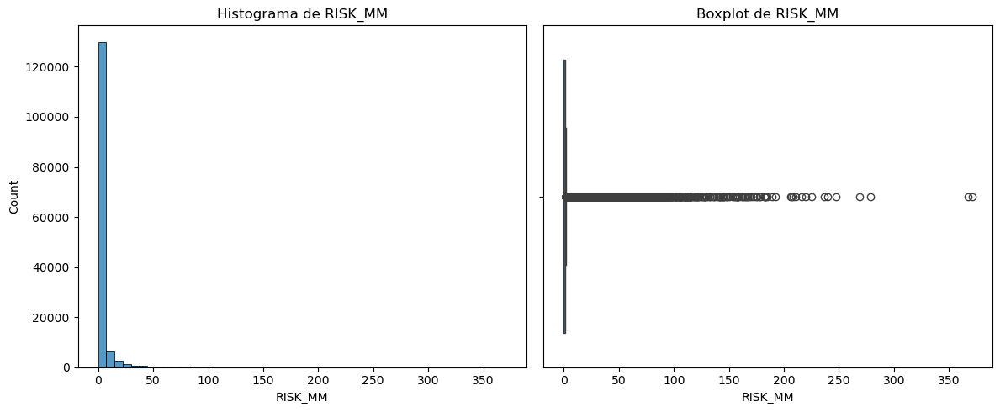

In [66]:
analisis_univariable(df, 'RISK_MM')

In [71]:
df.to_csv('../data/data_to_preparation.csv', index=False)

## Conclusiones Fase 2

Nuestros análisis nos han proporcionado una visión detallada de las variables meteorológicas en el dataset australiano, confirmando varios aspectos de nuestras hipótesis iniciales y revelando patrones interesantes:

*  Hemos confirmado visualmente y a través de las estadísticas descriptivas la naturaleza binaria de "RainTomorrow" (no mostrado directamente en los análisis de esta fase, pero implícito en la necesidad de predicción) y la naturaleza continua de "RISK_MM". Esto respalda la necesidad de un enfoque mixto de modelado (clasificación y regresión) como se planteó en la hipótesis.

* Aunque no analizamos directamente la segmentación por región en estos análisis generales, las diferencias significativas encontradas en los rangos y distribuciones de variables como la temperatura y la lluvia (en fases anteriores) sugieren que el comportamiento de estas variables puede variar considerablemente entre ubicaciones, apoyando la idea de que la precisión del modelo podría depender de la región.

* Aunque no analizamos directamente "RainTomorrow" en estos gráficos, las correlaciones observadas con "RISK_MM" (que está fuertemente ligada a la probabilidad de lluvia al día siguiente) sugieren que variables como la lluvia del día actual, la humedad y la nubosidad probablemente serán predictores importantes también para el modelo de clasificación.